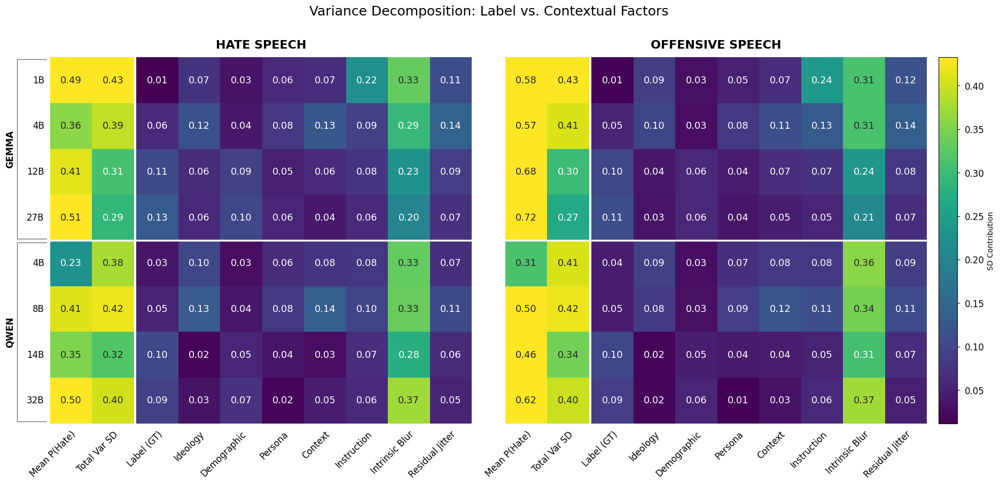

In [1]:
import os
import re
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION
# ==========================================
RESULTS_DIR_HS = "./output_hate_speech/results_hs"
RESULTS_DIR_OFF = "./output_offensive_speech/results_hs"
PLOTS_OUTPUT_DIR = "./output_hate_speech/plots"
os.makedirs(PLOTS_OUTPUT_DIR, exist_ok=True)

FINAL_MODELS = [
    'google/gemma-3-1b-it', 'google/gemma-3-4b-it', 'google/gemma-3-12b-it', 'google/gemma-3-27b-it',
    'Qwen/Qwen3-4B', 'Qwen/Qwen3-8B', 'Qwen/Qwen3-14B', 'Qwen/Qwen3-32B'
]

# ==========================================
# 2. UTILITIES
# ==========================================

def get_model_sort_key(model_name):
    size_match = re.search(r'(\d+)[BbMm]', model_name)
    size = float(size_match.group(1)) if size_match else 0.0
    family = re.split(r'[/_]', model_name.lower())[0]
    return (family, size)

def extract_family(model_name):
    """Extract clean family name for bracket labels: 'google/gemma-3-1b-it' -> 'gemma'"""
    name = model_name.split('/')[-1] if '/' in model_name else model_name
    match = re.match(r'^([a-zA-Z]+)', name)
    return match.group(1).lower() if match else 'unknown'

def prepare_rigorous_factors(df):
    df = df.copy()
    target_cols = [c for c in df.columns if c.endswith('_target')]
    df['target'] = df[target_cols[0]].fillna('None').astype(str) if target_cols else 'None'

    cols_to_fill = ['quantization', 'language', 'target', 'ideology']
    for c in cols_to_fill:
        if c in df.columns:
            df[c] = df[c].fillna('None').astype(str)
            
    df['context_combo'] = df['context_id'].apply(lambda x: 'None' if pd.isna(x) or x == -1 else f"Ctx_{int(x)}")
    df['instr_combo'] = df['instr_idx'].fillna(-1).astype(int).astype(str)
    df['persona_combo'] = df.apply(
        lambda row: 'None' if pd.isna(row.get('persona_class')) or row.get('persona_class') == '' 
                    else f"{row['persona_class']}_idx{int(row['persona_idx'])}", axis=1
    )
    return df

# ==========================================
# 3. SCORING (MELTING TO LONG FORMAT)
# ==========================================

def calculate_scores_long(df):
    prob_true_cols = sorted([c for c in df.columns if c.endswith('_prob_ans_0')])
    q_prefixes = [c.replace('_prob_ans_0', '') for c in prob_true_cols]
    gt_cols = [f"{p}_is_hate_speech" for p in q_prefixes]

    p_matrix = df[prob_true_cols].values
    def to_bool(val):
        return val.lower() in ['true', '1', 'yes'] if isinstance(val, str) else bool(val)
    
    # Compatible with pandas >= 2.1
    gt_matrix = df[gt_cols].apply(lambda col: col.map(to_bool)).values

    melted_data = []
    factors = ['model', 'ideology', 'target', 'context_combo', 'instr_combo', 'persona_combo']

    for i, row in df.iterrows():
        p_hs = p_matrix[i][gt_matrix[i] == True]
        p_non = p_matrix[i][gt_matrix[i] == False]

        if len(p_hs) > 0:
            melted_data.append({
                **{f: row[f] for f in factors},
                'is_hate_speech': 'Hate Speech',
                'score_prob': np.mean(p_hs),
                'pointwise_blur': np.mean(p_hs * (1 - p_hs))
            })
        
        if len(p_non) > 0:
            melted_data.append({
                **{f: row[f] for f in factors},
                'is_hate_speech': 'Non-Hate Speech',
                'score_prob': np.mean(p_non),
                'pointwise_blur': np.mean(p_non * (1 - p_non))
            })

    return pd.DataFrame(melted_data)

# ==========================================
# 4. ANOVA ANALYSIS
# ==========================================

def analyze_factor_sensitivity(df):
    factors = ['is_hate_speech', 'target', 'context_combo', 'instr_combo', 'persona_combo']
    results = []

    for model_name, model_df in df.groupby('model'):
        total_n = len(model_df)
        var_of_means = model_df['score_prob'].var(ddof=0)
        mean_intrinsic_blur = model_df['pointwise_blur'].mean()
        total_pointwise_var = var_of_means + mean_intrinsic_blur

        sum_ss_factors = {f: 0.0 for f in factors}
        sum_ss_residual = 0.0
        
        for ideology, sub_df in model_df.groupby('ideology'):
            active_f = [f for f in factors if sub_df[f].nunique() > 1]
            if active_f and len(sub_df) > len(active_f):
                formula = "score_prob ~ " + " + ".join([f"C({f}, Sum)" for f in active_f])
                try:
                    fit = ols(formula, data=sub_df).fit()
                    tab = anova_lm(fit, typ=3)
                    for f in active_f:
                        sum_ss_factors[f] += tab.loc[f"C({f}, Sum)", 'sum_sq']
                    sum_ss_residual += tab.loc['Residual', 'sum_sq']
                except:
                    sum_ss_residual += sub_df['score_prob'].var(ddof=0) * len(sub_df)
            else:
                sum_ss_residual += sub_df['score_prob'].var(ddof=0) * len(sub_df)

        res = {
            'model':           model_name,
            'Mean P(Hate)':    model_df['score_prob'].mean(),
            'Total Var SD':    np.sqrt(total_pointwise_var),
            'Ideology SD':     model_df.groupby('ideology')['score_prob'].mean().std(),
            'Intrinsic Blur':  np.sqrt(mean_intrinsic_blur),
            'Residual Jitter': np.sqrt(sum_ss_residual / total_n)
        }
        for f in factors:
            res[f"{f} SD"] = np.sqrt(sum_ss_factors[f] / total_n)
        results.append(res)

    return pd.DataFrame(results)

# ==========================================
# 5. SIDE-BY-SIDE HEATMAP PLOTTING
# ==========================================

def plot_unified_sensitivity_sidebyside(hs_results_df, off_results_df):
    # Sort both dataframes consistently
    hs_results_df['sk'] = hs_results_df['model'].apply(get_model_sort_key)
    hs_df = hs_results_df.sort_values('sk').drop('sk', axis=1)
    
    off_results_df['sk'] = off_results_df['model'].apply(get_model_sort_key)
    off_df = off_results_df.sort_values('sk').drop('sk', axis=1)
    off_df = off_df.set_index('model').reindex(hs_df['model']).reset_index()

    group_main = ['Mean P(Hate)', 'Total Var SD']
    group_factors = [
        'is_hate_speech SD', 'Ideology SD', 'target SD', 
        'persona_combo SD', 'context_combo SD', 'instr_combo SD', 
        'Intrinsic Blur', 'Residual Jitter'
    ]

    label_map = {
        'Mean P(Hate)':     'Mean P(Hate)',
        'Total Var SD':     'Total Var SD',
        'is_hate_speech SD':'Label (GT)',
        'Ideology SD':      'Ideology',
        'persona_combo SD': 'Persona',
        'target SD':        'Demographic',
        'context_combo SD': 'Context',
        'instr_combo SD':   'Instruction',
        'Intrinsic Blur':   'Intrinsic Blur',
        'Residual Jitter':  'Residual Jitter',
    }

    def create_annot(data, cols):
        return data.set_index('model')[cols].apply(lambda col: col.map(lambda v: f"{v:.2f}"))

    # Shared color scale
    sd_cols = ['Total Var SD'] + group_factors
    all_vals = pd.concat([
        hs_df.set_index('model')[sd_cols],
        off_df.set_index('model')[sd_cols],
    ]).values
    vmin, vmax = float(np.nanmin(all_vals)), float(np.nanmax(all_vals))
    
    hm_kw = dict(fmt="", cmap="viridis", vmin=vmin, vmax=vmax, annot_kws={"size": 13}, cbar=False)

    # GridSpec: [hs_main | gap | hs_factors | panel_gap | off_main | gap | off_factors | cbar_gap | cbar]
    n_a, n_b = len(group_main), len(group_factors)
    col_w, gap_w, panel_w, cbar_gap_w, cbar_w = 1.0, 0.06, 0.8, 0.28, 0.45
    add_x_dist = 0.008

    width_ratios = [n_a*col_w, gap_w, n_b*col_w, panel_w, n_a*col_w, gap_w, n_b*col_w, cbar_gap_w, cbar_w]
    fig_w, fig_h = sum(width_ratios)*0.92 + 2, len(hs_df)*0.55 + 4.5

    fig = plt.figure(figsize=(fig_w, fig_h))
    gs = gridspec.GridSpec(1, 9, width_ratios=width_ratios, wspace=0.0)

    ax_hsa, ax_hsg, ax_hsb = fig.add_subplot(gs[0]), fig.add_subplot(gs[1]), fig.add_subplot(gs[2])
    ax_offa, ax_offg, ax_offb = fig.add_subplot(gs[4]), fig.add_subplot(gs[5]), fig.add_subplot(gs[6])
    ax_cb = fig.add_subplot(gs[8])
    
    ax_hsg.set_visible(False)
    ax_offg.set_visible(False)

    def size_label(model_name):
        m = re.search(r'(\d+\.?\d*)[BbMm]', model_name)
        return f"{m.group(1)}B" if m else model_name
    size_labels = [size_label(m) for m in hs_df['model']]

    def draw_hm(ax, df, cols, yticks=False):
        sns.heatmap(df.set_index('model')[cols], annot=create_annot(df, cols), ax=ax, **hm_kw)
        if yticks:
            ax.set_yticklabels(size_labels, fontsize=12)
            ax.set_ylabel("")
        else:
            ax.set_yticks([])
            ax.set_ylabel("")
        ax.set_xticklabels([label_map.get(c, c) for c in cols], rotation=45, ha='right', fontsize=12, rotation_mode='anchor')
        ax.set_xlabel("")
        ax.tick_params(length=0, pad=8)

    draw_hm(ax_hsa, hs_df, group_main, yticks=True)
    draw_hm(ax_hsb, hs_df, group_factors)
    draw_hm(ax_offa, off_df, group_main)
    draw_hm(ax_offb, off_df, group_factors)

    # Colorbar
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap='viridis', norm=norm), cax=ax_cb, label='SD Contribution')
    cbar.ax.tick_params(labelsize=12, pad=6)

    # Family bracket labels on LEFT of first panel
    fam_raw = hs_df['model'].apply(extract_family).values
    spans, i = [], 0
    while i < len(fam_raw):
        j = i
        while j < len(fam_raw) and fam_raw[j] == fam_raw[i]:
            j += 1
        spans.append((fam_raw[i].upper(), i, j-1))
        if j < len(fam_raw):
            for ax in [ax_hsa, ax_hsb, ax_offa, ax_offb]:
                ax.axhline(j, color='white', lw=2.5)
        i = j

    fig.canvas.draw()
    ax_pos = ax_hsa.get_position()
    n_rows, row_h = len(hs_df), (ax_pos.y1 - ax_pos.y0) / len(hs_df)
    bracket_x, tick_x = ax_pos.x0 - 0.02, ax_pos.x0 - 0.003

    for fam_name, r0, r1 in spans:
        y_top = ax_pos.y1 - r0 * row_h
        y_bot = ax_pos.y1 - (r1 + 1) * row_h
        y_mid = (y_top + y_bot) / 2
        fig.text(bracket_x - 0.010, y_mid, fam_name, ha='right', va='center', rotation=90,
                 fontsize=12, fontweight='bold', transform=fig.transFigure)
        bracket_lw = 0.8
        fig.add_artist(plt.Line2D([bracket_x-add_x_dist, bracket_x-add_x_dist], [y_bot+0.004, y_top-0.004],
                                  transform=fig.transFigure, color='#555555', lw=bracket_lw, clip_on=False))
        for y_end in [y_top-0.004, y_bot+0.004]:
            fig.add_artist(plt.Line2D([bracket_x-add_x_dist, tick_x], [y_end, y_end],
                                      transform=fig.transFigure, color='#555555', lw=bracket_lw, clip_on=False))

    # Panel titles
    def mid_x(axL, axR): return (axL.get_position().x0 + axR.get_position().x1) / 2
    top_y = ax_hsa.get_position().y1 + 0.015
    fig.text(mid_x(ax_hsa, ax_hsb), top_y, "HATE SPEECH", ha='center', va='bottom', fontsize=16, fontweight='bold', transform=fig.transFigure)
    fig.text(mid_x(ax_offa, ax_offb), top_y, "OFFENSIVE SPEECH", ha='center', va='bottom', fontsize=16, fontweight='bold', transform=fig.transFigure)

    plt.suptitle("Variance Decomposition: Label vs. Contextual Factors", fontsize=18, y=0.99)
    plt.savefig(os.path.join(PLOTS_OUTPUT_DIR, "unified_decomposition_sidebyside.png"), bbox_inches='tight', dpi=150)
    plt.show()

# ==========================================
# 6. MAIN
# ==========================================

def process_dataset(results_dir):
    all_files = [os.path.join(results_dir, f) for f in os.listdir(results_dir) if f.endswith(".csv")]
    if not all_files:
        return None
    df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)
    df = df[df['model'].isin(FINAL_MODELS)].copy()
    df = prepare_rigorous_factors(df)
    df_long = calculate_scores_long(df)
    return analyze_factor_sensitivity(df_long)

def main():
    hs_results = process_dataset(RESULTS_DIR_HS)
    off_results = process_dataset(RESULTS_DIR_OFF)
    
    if hs_results is None or off_results is None:
        print("Warning: One or both datasets could not be processed.")
        return
    
    plot_unified_sensitivity_sidebyside(hs_results, off_results)

if __name__ == "__main__":
    main()

Running analysis in 'logit' space...

SPACE: LOGIT
Score column: score_logit | Blur column: pointwise_blur_logit

Top 3 models by Total Var SD (Hate Speech):
                model  Mean Score  Total Var SD  Intrinsic Blur  is_hate_speech SD
google/gemma-3-27b-it    1.096917      8.228036        7.074793           2.612949
google/gemma-3-12b-it   -0.423419      6.259765        5.338173           1.631252
       Qwen/Qwen3-14B   -1.780719      4.149847        3.734752           1.198262



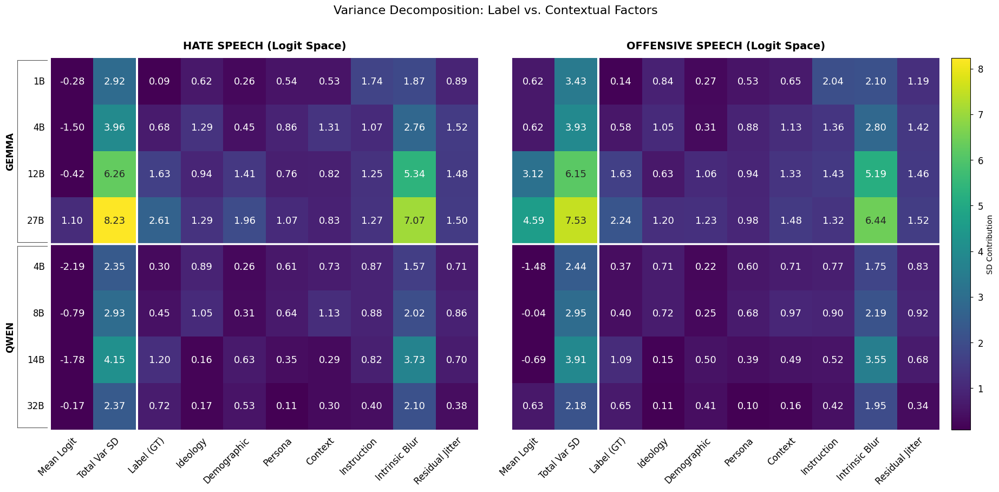

In [2]:
import os
import re
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION
# ==========================================
RESULTS_DIR_HS = "./output_hate_speech/results_hs"
RESULTS_DIR_OFF = "./output_offensive_speech/results_hs"
PLOTS_OUTPUT_DIR = "./output_hate_speech/plots"
os.makedirs(PLOTS_OUTPUT_DIR, exist_ok=True)

# 🔧 Toggle analysis space: 'prob' or 'logit'
SPACE = 'logit'  # ← Change to 'prob' for original probability-space analysis
LOGIT_EPS = 1e-6  # Clipping value to avoid log(0)

FINAL_MODELS = [
    'google/gemma-3-1b-it', 'google/gemma-3-4b-it', 'google/gemma-3-12b-it', 'google/gemma-3-27b-it',
    'Qwen/Qwen3-4B', 'Qwen/Qwen3-8B', 'Qwen/Qwen3-14B', 'Qwen/Qwen3-32B'
]

# ==========================================
# 2. UTILITIES
# ==========================================

def get_model_sort_key(model_name):
    size_match = re.search(r'(\d+)[BbMm]', model_name)
    size = float(size_match.group(1)) if size_match else 0.0
    family = re.split(r'[/_]', model_name.lower())[0]
    return (family, size)

def extract_family(model_name):
    name = model_name.split('/')[-1] if '/' in model_name else model_name
    match = re.match(r'^([a-zA-Z]+)', name)
    return match.group(1).lower() if match else 'unknown'

def prob_to_logit(p, eps=LOGIT_EPS):
    """Stable logit transformation with clipping."""
    p_clipped = np.clip(p, eps, 1 - eps)
    return np.log(p_clipped / (1 - p_clipped))

def prepare_rigorous_factors(df):
    df = df.copy()
    target_cols = [c for c in df.columns if c.endswith('_target')]
    df['target'] = df[target_cols[0]].fillna('None').astype(str) if target_cols else 'None'

    cols_to_fill = ['quantization', 'language', 'target', 'ideology']
    for c in cols_to_fill:
        if c in df.columns:
            df[c] = df[c].fillna('None').astype(str)
            
    df['context_combo'] = df['context_id'].apply(lambda x: 'None' if pd.isna(x) or x == -1 else f"Ctx_{int(x)}")
    df['instr_combo'] = df['instr_idx'].fillna(-1).astype(int).astype(str)
    df['persona_combo'] = df.apply(
        lambda row: 'None' if pd.isna(row.get('persona_class')) or row.get('persona_class') == '' 
                    else f"{row['persona_class']}_idx{int(row['persona_idx'])}", axis=1
    )
    return df

# ==========================================
# 3. SCORING (MELTING TO LONG FORMAT)
# ==========================================

def calculate_scores_long(df, space=SPACE):
    prob_true_cols = sorted([c for c in df.columns if c.endswith('_prob_ans_0')])
    q_prefixes = [c.replace('_prob_ans_0', '') for c in prob_true_cols]
    gt_cols = [f"{p}_is_hate_speech" for p in q_prefixes]

    p_matrix = df[prob_true_cols].values
    def to_bool(val):
        return val.lower() in ['true', '1', 'yes'] if isinstance(val, str) else bool(val)
    
    gt_matrix = df[gt_cols].apply(lambda col: col.map(to_bool)).values

    # Transform to logit space if requested
    if space == 'logit':
        p_matrix = prob_to_logit(p_matrix)
        score_name = 'score_logit'
        blur_name = 'pointwise_blur_logit'
    else:
        score_name = 'score_prob'
        blur_name = 'pointwise_blur'

    melted_data = []
    factors = ['model', 'ideology', 'target', 'context_combo', 'instr_combo', 'persona_combo']

    for i, row in df.iterrows():
        p_hs = p_matrix[i][gt_matrix[i] == True]
        p_non = p_matrix[i][gt_matrix[i] == False]

        if len(p_hs) > 0:
            melted_data.append({
                **{f: row[f] for f in factors},
                'is_hate_speech': 'Hate Speech',
                score_name: np.mean(p_hs),
                blur_name: np.var(p_hs, ddof=0) if space == 'logit' else np.mean(p_hs * (1 - p_hs))
            })
        
        if len(p_non) > 0:
            melted_data.append({
                **{f: row[f] for f in factors},
                'is_hate_speech': 'Non-Hate Speech',
                score_name: np.mean(p_non),
                blur_name: np.var(p_non, ddof=0) if space == 'logit' else np.mean(p_non * (1 - p_non))
            })

    return pd.DataFrame(melted_data), score_name, blur_name

# ==========================================
# 4. ANOVA ANALYSIS
# ==========================================

def analyze_factor_sensitivity(df, score_col, blur_col):
    factors = ['is_hate_speech', 'target', 'context_combo', 'instr_combo', 'persona_combo']
    results = []

    for model_name, model_df in df.groupby('model'):
        total_n = len(model_df)
        var_of_means = model_df[score_col].var(ddof=0)
        mean_intrinsic_blur = model_df[blur_col].mean()
        total_pointwise_var = var_of_means + mean_intrinsic_blur

        sum_ss_factors = {f: 0.0 for f in factors}
        sum_ss_residual = 0.0
        
        for ideology, sub_df in model_df.groupby('ideology'):
            active_f = [f for f in factors if sub_df[f].nunique() > 1]
            if active_f and len(sub_df) > len(active_f):
                formula = f"{score_col} ~ " + " + ".join([f"C({f}, Sum)" for f in active_f])
                try:
                    fit = ols(formula, data=sub_df).fit()
                    tab = anova_lm(fit, typ=3)
                    for f in active_f:
                        sum_ss_factors[f] += tab.loc[f"C({f}, Sum)", 'sum_sq']
                    sum_ss_residual += tab.loc['Residual', 'sum_sq']
                except:
                    sum_ss_residual += sub_df[score_col].var(ddof=0) * len(sub_df)
            else:
                sum_ss_residual += sub_df[score_col].var(ddof=0) * len(sub_df)

        res = {
            'model':           model_name,
            'Mean Score':      model_df[score_col].mean(),
            'Total Var SD':    np.sqrt(total_pointwise_var),
            'Ideology SD':     model_df.groupby('ideology')[score_col].mean().std(),
            'Intrinsic Blur':  np.sqrt(mean_intrinsic_blur),
            'Residual Jitter': np.sqrt(sum_ss_residual / total_n)
        }
        for f in factors:
            res[f"{f} SD"] = np.sqrt(sum_ss_factors[f] / total_n)
        results.append(res)

    return pd.DataFrame(results)

# ==========================================
# 5. SIDE-BY-SIDE HEATMAP PLOTTING
# ==========================================

def plot_unified_sensitivity_sidebyside(hs_results_df, off_results_df, space=SPACE):
    # Sort both dataframes consistently
    hs_results_df['sk'] = hs_results_df['model'].apply(get_model_sort_key)
    hs_df = hs_results_df.sort_values('sk').drop('sk', axis=1)
    
    off_results_df['sk'] = off_results_df['model'].apply(get_model_sort_key)
    off_df = off_results_df.sort_values('sk').drop('sk', axis=1)
    off_df = off_df.set_index('model').reindex(hs_df['model']).reset_index()

    # Column groups - use generic names since score type varies by space
    group_main = ['Mean Score', 'Total Var SD']
    group_factors = [
        'is_hate_speech SD', 'Ideology SD', 'target SD', 
        'persona_combo SD', 'context_combo SD', 'instr_combo SD', 
        'Intrinsic Blur', 'Residual Jitter'
    ]

    # Dynamic labels based on space
    score_label = 'Mean Logit' if space == 'logit' else 'Mean P(Hate)'
    label_map = {
        'Mean Score':       score_label,
        'Total Var SD':     'Total Var SD',
        'is_hate_speech SD':'Label (GT)',
        'Ideology SD':      'Ideology',
        'persona_combo SD': 'Persona',
        'target SD':        'Demographic',
        'context_combo SD': 'Context',
        'instr_combo SD':   'Instruction',
        'Intrinsic Blur':   'Intrinsic Blur',
        'Residual Jitter':  'Residual Jitter',
    }

    def create_annot(data, cols):
        return data.set_index('model')[cols].apply(lambda col: col.map(lambda v: f"{v:.2f}"))

    # Shared color scale
    sd_cols = ['Total Var SD'] + group_factors
    all_vals = pd.concat([
        hs_df.set_index('model')[sd_cols],
        off_df.set_index('model')[sd_cols],
    ]).values
    vmin, vmax = float(np.nanmin(all_vals)), float(np.nanmax(all_vals))
    
    hm_kw = dict(fmt="", cmap="viridis", vmin=vmin, vmax=vmax, annot_kws={"size": 13}, cbar=False)

    # GridSpec layout
    n_a, n_b = len(group_main), len(group_factors)
    col_w, gap_w, panel_w, cbar_gap_w, cbar_w = 1.0, 0.06, 0.8, 0.28, 0.45
    add_x_dist = 0.008

    width_ratios = [n_a*col_w, gap_w, n_b*col_w, panel_w, n_a*col_w, gap_w, n_b*col_w, cbar_gap_w, cbar_w]
    fig_w, fig_h = sum(width_ratios)*0.92 + 2, len(hs_df)*0.55 + 4.5

    fig = plt.figure(figsize=(fig_w, fig_h))
    gs = gridspec.GridSpec(1, 9, width_ratios=width_ratios, wspace=0.0)

    ax_hsa, ax_hsg, ax_hsb = fig.add_subplot(gs[0]), fig.add_subplot(gs[1]), fig.add_subplot(gs[2])
    ax_offa, ax_offg, ax_offb = fig.add_subplot(gs[4]), fig.add_subplot(gs[5]), fig.add_subplot(gs[6])
    ax_cb = fig.add_subplot(gs[8])
    
    ax_hsg.set_visible(False)
    ax_offg.set_visible(False)

    def size_label(model_name):
        m = re.search(r'(\d+\.?\d*)[BbMm]', model_name)
        return f"{m.group(1)}B" if m else model_name
    size_labels = [size_label(m) for m in hs_df['model']]

    def draw_hm(ax, df, cols, yticks=False):
        sns.heatmap(df.set_index('model')[cols], annot=create_annot(df, cols), ax=ax, **hm_kw)
        if yticks:
            ax.set_yticklabels(size_labels, fontsize=12)
            ax.set_ylabel("")
        else:
            ax.set_yticks([])
            ax.set_ylabel("")
        ax.set_xticklabels([label_map.get(c, c) for c in cols], rotation=45, ha='right', fontsize=12, rotation_mode='anchor')
        ax.set_xlabel("")
        ax.tick_params(length=0, pad=8)

    draw_hm(ax_hsa, hs_df, group_main, yticks=True)
    draw_hm(ax_hsb, hs_df, group_factors)
    draw_hm(ax_offa, off_df, group_main)
    draw_hm(ax_offb, off_df, group_factors)

    # Colorbar
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap='viridis', norm=norm), cax=ax_cb, label='SD Contribution')
    cbar.ax.tick_params(labelsize=12, pad=6)

    # Family bracket labels on LEFT
    fam_raw = hs_df['model'].apply(extract_family).values
    spans, i = [], 0
    while i < len(fam_raw):
        j = i
        while j < len(fam_raw) and fam_raw[j] == fam_raw[i]:
            j += 1
        spans.append((fam_raw[i].upper(), i, j-1))
        if j < len(fam_raw):
            for ax in [ax_hsa, ax_hsb, ax_offa, ax_offb]:
                ax.axhline(j, color='white', lw=2.5)
        i = j

    fig.canvas.draw()
    ax_pos = ax_hsa.get_position()
    n_rows, row_h = len(hs_df), (ax_pos.y1 - ax_pos.y0) / len(hs_df)
    bracket_x, tick_x = ax_pos.x0 - 0.02, ax_pos.x0 - 0.003

    for fam_name, r0, r1 in spans:
        y_top = ax_pos.y1 - r0 * row_h
        y_bot = ax_pos.y1 - (r1 + 1) * row_h
        y_mid = (y_top + y_bot) / 2
        fig.text(bracket_x - 0.010, y_mid, fam_name, ha='right', va='center', rotation=90,
                 fontsize=12, fontweight='bold', transform=fig.transFigure)
        bracket_lw = 0.8
        fig.add_artist(plt.Line2D([bracket_x-add_x_dist, bracket_x-add_x_dist], [y_bot+0.004, y_top-0.004],
                                  transform=fig.transFigure, color='#555555', lw=bracket_lw, clip_on=False))
        for y_end in [y_top-0.004, y_bot+0.004]:
            fig.add_artist(plt.Line2D([bracket_x-add_x_dist, tick_x], [y_end, y_end],
                                      transform=fig.transFigure, color='#555555', lw=bracket_lw, clip_on=False))

    # Panel titles with space indicator
    space_suffix = " (Logit Space)" if space == 'logit' else " (Probability Space)"
    def mid_x(axL, axR): return (axL.get_position().x0 + axR.get_position().x1) / 2
    top_y = ax_hsa.get_position().y1 + 0.015
    fig.text(mid_x(ax_hsa, ax_hsb), top_y, "HATE SPEECH" + space_suffix, ha='center', va='bottom', fontsize=14, fontweight='bold', transform=fig.transFigure)
    fig.text(mid_x(ax_offa, ax_offb), top_y, "OFFENSIVE SPEECH" + space_suffix, ha='center', va='bottom', fontsize=14, fontweight='bold', transform=fig.transFigure)

    plt.suptitle("Variance Decomposition: Label vs. Contextual Factors", fontsize=16, y=0.99)
    suffix = "_logit" if space == 'logit' else ""
    plt.savefig(os.path.join(PLOTS_OUTPUT_DIR, f"unified_decomposition_sidebyside{suffix}.png"), bbox_inches='tight', dpi=150)
    plt.show()

# ==========================================
# 6. MAIN
# ==========================================

def process_dataset(results_dir, space=SPACE):
    all_files = [os.path.join(results_dir, f) for f in os.listdir(results_dir) if f.endswith(".csv")]
    if not all_files:
        return None, None, None
    df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)
    df = df[df['model'].isin(FINAL_MODELS)].copy()
    df = prepare_rigorous_factors(df)
    df_long, score_col, blur_col = calculate_scores_long(df, space=space)
    results = analyze_factor_sensitivity(df_long, score_col, blur_col)
    return results, score_col, blur_col

def main():
    print(f"Running analysis in '{SPACE}' space...")
    
    hs_results, hs_score_col, hs_blur_col = process_dataset(RESULTS_DIR_HS, space=SPACE)
    off_results, off_score_col, off_blur_col = process_dataset(RESULTS_DIR_OFF, space=SPACE)
    
    if hs_results is None or off_results is None:
        print("Warning: One or both datasets could not be processed.")
        return
    
    # Print quick summary for inspection
    print(f"\n{'='*60}")
    print(f"SPACE: {SPACE.upper()}")
    print(f"Score column: {hs_score_col} | Blur column: {hs_blur_col}")
    print(f"\nTop 3 models by Total Var SD (Hate Speech):")
    print(hs_results[['model', 'Mean Score', 'Total Var SD', 'Intrinsic Blur', 'is_hate_speech SD']].sort_values('Total Var SD', ascending=False).head(3).to_string(index=False))
    print(f"{'='*60}\n")
    
    plot_unified_sensitivity_sidebyside(hs_results, off_results, space=SPACE)

if __name__ == "__main__":
    main()

--- Rebuilding Cache: Final Stability & Smoothness Fix ---


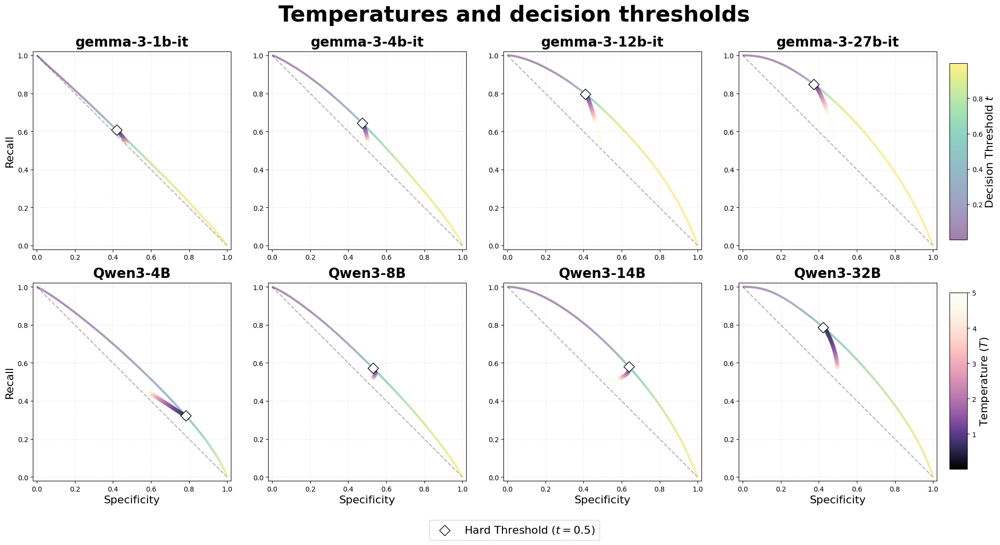

In [1]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy.special import expit

warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION & STYLE
# ==========================================
RESULTS_DIR = "./output_offensive_speech/results_hs"
CACHE_PATH = "./output_offensive_speech/calibration_cache_v0.parquet" 
PLOTS_OUTPUT_DIR = "./output/plots"

MODEL_FLAT_LIST = [
    'results_google_gemma-3-1b-it_bf16.csv',  'results_google_gemma-3-4b-it_bf16.csv',
    'results_google_gemma-3-12b-it_bf16.csv', 'results_google_gemma-3-27b-it_bf16.csv',
    'results_Qwen_Qwen3-4B_bf16.csv',         'results_Qwen_Qwen3-8B_bf16.csv',
    'results_Qwen_Qwen3-14B_bf16.csv',        'results_Qwen_Qwen3-32B_bf16.csv'
]

FONT_SIZE_SUPTITLE = 32
FONT_SIZE_TITLE = 20
FONT_SIZE_AXIS = 16
FONT_SIZE_TICK = 12
FONT_SIZE_LEGEND = 16

# --- SPACING CONTROLS ---
# Lower values make the plots larger and closer together
W_SPACE = -0.2    # Horizontal gap between squares
H_SPACE = 0.17    # Vertical gap (space for titles)
MARGIN_LEFT = 0.05
MARGIN_RIGHT = 0.90 # Leave room for colorbars
MARGIN_TOP = 0.88
MARGIN_BOTTOM = 0.15

# ==========================================
# 2. DATA ENGINE (Logic remains same)
# ==========================================
def get_calibration_data():
    if os.path.exists(CACHE_PATH):
        return pd.read_parquet(CACHE_PATH)

    print("--- Rebuilding Cache: Final Stability & Smoothness Fix ---")
    master_list = []
    for fname in MODEL_FLAT_LIST:
        fpath = os.path.join(RESULTS_DIR, fname)
        if not os.path.exists(fpath): continue
        
        df_raw = pd.read_csv(fpath)
        # MAP: ans_0 -> True -> Hate | ans_1 -> False -> Clean
        p0_cols = sorted([c for c in df_raw.columns if 'prob_ans_0' in c])
        p1_cols = sorted([c for c in df_raw.columns if 'prob_ans_1' in c])
        g_cols  = sorted([c for c in df_raw.columns if 'is_hate_speech' in c])

        for i in range(len(p0_cols)):
            h_raw = df_raw[p0_cols[i]].values
            c_raw = df_raw[p1_cols[i]].values
            
            # STABILITY: Deriving the large value from the more precise smaller value
            p_hate = np.where(h_raw < c_raw, h_raw, 1.0 - c_raw)
            p_clean = 1.0 - p_hate
            
            gt = df_raw[g_cols[i]].astype(str).str.lower().isin(['true', '1', 'yes']).astype(int)
            
            temp = pd.DataFrame({'file': fname, 'p_hate': p_hate, 'p_clean': p_clean, 'gt': gt}).dropna()
            master_list.append(temp)

    master_df = pd.concat(master_list, ignore_index=True)
    master_df['logit'] = np.log(np.maximum(master_df['p_hate'], 1e-25)) - \
                         np.log(np.maximum(master_df['p_clean'], 1e-25))
    
    os.makedirs(os.path.dirname(CACHE_PATH), exist_ok=True)
    master_df.to_parquet(CACHE_PATH, index=False)
    return master_df

def compute_geometry(df_subset):
    l_vals = df_subset['logit'].values
    p_hate = expit(l_vals)
    gt = df_subset['gt'].values
    idx = np.argsort(p_hate)
    p_sorted = p_hate[idx]
    gt_sorted = gt[idx]
    tnr = np.cumsum(1 - gt_sorted) / (np.sum(1 - gt) + 1e-9)
    tpr = np.cumsum(gt_sorted[::-1])[::-1] / (np.sum(gt) + 1e-9)
    hard_mask = (p_hate >= 0.5)
    h_tpr = np.sum(hard_mask & (gt == 1)) / (np.sum(gt == 1) + 1e-9)
    h_tnr = np.sum((~hard_mask) & (gt == 0)) / (np.sum(gt == 0) + 1e-9)
    temps = np.concatenate([[1e-5], np.geomspace(0.01, 20, 150)])
    soft_pts = []
    is_h, is_c = (gt == 1), (gt == 0)
    for T in temps:
        p_t = expit(l_vals / T)
        soft_pts.append([np.mean(1 - p_t[is_c]), np.mean(p_t[is_h])])
    return (tnr, tpr, p_sorted), np.array(soft_pts), temps, (h_tnr, h_tpr)

# ==========================================
# 3. PLOTTING
# ==========================================
master_data = get_calibration_data()
# Using a 2:1 aspect ratio figure (24x12) fits a 4x2 grid of squares perfectly
fig, axes = plt.subplots(2, 4, figsize=(24, 12), facecolor='white')
axes_flat = axes.flatten()

# Custom colormap
v_data = plt.cm.magma(np.linspace(0, 1, 256))
v_data[:, -1] = np.linspace(1, 0.1, 256) 
fade_magma = LinearSegmentedColormap.from_list('FadeMagma', v_data)

for i, fname in enumerate(MODEL_FLAT_LIST):
    ax = axes_flat[i]
    df_model = master_data[master_data['file'] == fname]
    if df_model.empty: continue

    (tnr, tpr, p_sorted), soft_pts, temps, hard_pt = compute_geometry(df_model)
    
    step = max(1, len(tnr) // 5000)
    tnr_p, tpr_p, p_p = tnr[::step], tpr[::step], p_sorted[::step]
    
    h_seg = np.stack([np.column_stack([tnr_p[:-1], tpr_p[:-1]]), 
                      np.column_stack([tnr_p[1:], tpr_p[1:]])], axis=1)
    lc_h = LineCollection(h_seg, cmap='viridis', alpha=0.5, linewidths=3)
    lc_h.set_array(p_p) 
    ax.add_collection(lc_h)
    
    s_seg = np.stack([soft_pts[:-1], soft_pts[1:]], axis=1)
    lc_s = LineCollection(s_seg, cmap=fade_magma, linewidths=6, zorder=5)
    lc_s.set_array(np.clip(temps, 0, 5.0))
    ax.add_collection(lc_s)
    
    m_hard = ax.scatter(hard_pt[0], hard_pt[1], color='white', edgecolor='black', 
                        marker='D', s=120, zorder=10, label='Hard Threshold ($t=0.5$)')

    # Formatting
    ax.set_title(fname.split('_')[2], fontsize=FONT_SIZE_TITLE, fontweight='bold', pad=8)
    ax.set_xlim(-0.02, 1.02); ax.set_ylim(-0.02, 1.02)
    ax.set_aspect('equal') # This keeps them as "Actual Squares"
    ax.grid(True, linestyle=':', alpha=0.4)
    ax.plot([0, 1], [1, 0], color='black', linestyle='--', alpha=0.3, zorder=1) 
    
    # Only show outer labels to save space if desired, 
    # but here we keep them and just tighten the layout.
    if i // 4 == 1: ax.set_xlabel("Specificity", fontsize=FONT_SIZE_AXIS)
    if i % 4 == 0: ax.set_ylabel("Recall", fontsize=FONT_SIZE_AXIS)

# Adjusting the layout to make plots much larger
plt.subplots_adjust(
    left   = MARGIN_LEFT, 
    right  = MARGIN_RIGHT, 
    top    = MARGIN_TOP, 
    bottom = MARGIN_BOTTOM,
    wspace = W_SPACE, 
    hspace = H_SPACE
)


cax1 = fig.add_axes([0.87, 0.56, 0.015, 0.3])
fig.colorbar(lc_h, cax=cax1).set_label('Decision Threshold $t$', fontsize=FONT_SIZE_LEGEND)
cax2 = fig.add_axes([0.87, 0.17, 0.015, 0.3])
fig.colorbar(lc_s, cax=cax2).set_label('Temperature ($T$)', fontsize=FONT_SIZE_LEGEND)

fig.legend(handles=[m_hard], loc='lower center', bbox_to_anchor=(0.5, 0.04), 
           fontsize=FONT_SIZE_LEGEND, ncol=1)

plt.suptitle("Temperatures and decision thresholds", 
             fontsize=FONT_SIZE_SUPTITLE, fontweight='bold', y=0.96)

plt.savefig(os.path.join(PLOTS_OUTPUT_DIR, "Temperatures_and_decision_thresholds.png"), dpi=200, bbox_inches='tight')
plt.show()

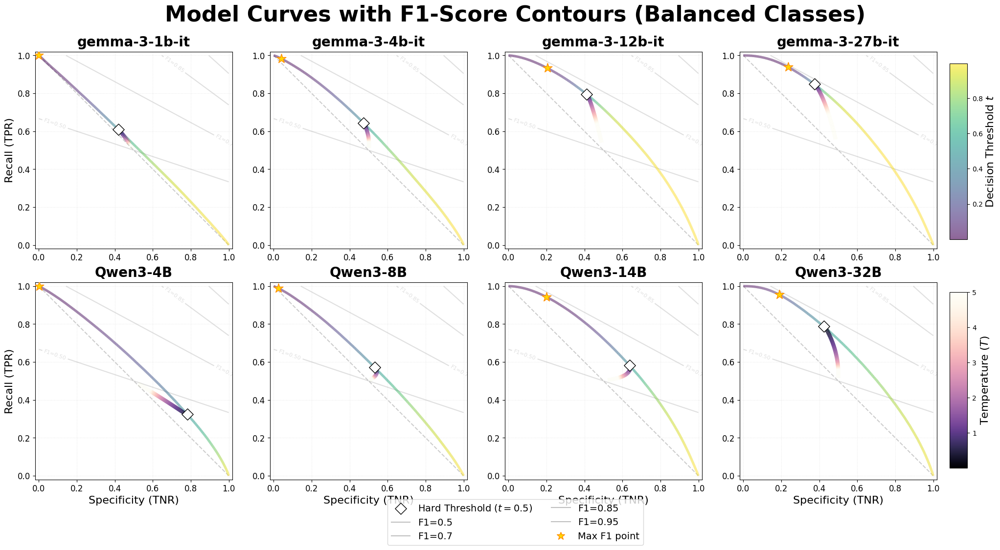

In [7]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy.special import expit

warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION & STYLE
# ==========================================
RESULTS_DIR = "./output_offensive_speech/results_hs"
CACHE_PATH = "./output_offensive_speech/calibration_cache_v0.parquet" 
PLOTS_OUTPUT_DIR = "./output/plots"

MODEL_FLAT_LIST = [
    'results_google_gemma-3-1b-it_bf16.csv',  'results_google_gemma-3-4b-it_bf16.csv',
    'results_google_gemma-3-12b-it_bf16.csv', 'results_google_gemma-3-27b-it_bf16.csv',
    'results_Qwen_Qwen3-4B_bf16.csv',         'results_Qwen_Qwen3-8B_bf16.csv',
    'results_Qwen_Qwen3-14B_bf16.csv',        'results_Qwen_Qwen3-32B_bf16.csv'
]

FONT_SIZE_SUPTITLE = 32
FONT_SIZE_TITLE = 20
FONT_SIZE_AXIS = 16
FONT_SIZE_TICK = 12
FONT_SIZE_LEGEND = 16

# --- SPACING CONTROLS ---
W_SPACE = -0.2
H_SPACE = 0.17
MARGIN_LEFT = 0.05
MARGIN_RIGHT = 0.90
MARGIN_TOP = 0.88
MARGIN_BOTTOM = 0.15

# ==========================================
# 2. DATA ENGINE (unchanged)
# ==========================================
def get_calibration_data():
    if os.path.exists(CACHE_PATH):
        return pd.read_parquet(CACHE_PATH)

    print("--- Rebuilding Cache: Final Stability & Smoothness Fix ---")
    master_list = []
    for fname in MODEL_FLAT_LIST:
        fpath = os.path.join(RESULTS_DIR, fname)
        if not os.path.exists(fpath): continue
        
        df_raw = pd.read_csv(fpath)
        p0_cols = sorted([c for c in df_raw.columns if 'prob_ans_0' in c])
        p1_cols = sorted([c for c in df_raw.columns if 'prob_ans_1' in c])
        g_cols  = sorted([c for c in df_raw.columns if 'is_hate_speech' in c])

        for i in range(len(p0_cols)):
            h_raw = df_raw[p0_cols[i]].values
            c_raw = df_raw[p1_cols[i]].values
            p_hate = np.where(h_raw < c_raw, h_raw, 1.0 - c_raw)
            p_clean = 1.0 - p_hate
            gt = df_raw[g_cols[i]].astype(str).str.lower().isin(['true', '1', 'yes']).astype(int)
            temp = pd.DataFrame({'file': fname, 'p_hate': p_hate, 'p_clean': p_clean, 'gt': gt}).dropna()
            master_list.append(temp)

    master_df = pd.concat(master_list, ignore_index=True)
    master_df['logit'] = np.log(np.maximum(master_df['p_hate'], 1e-25)) - \
                         np.log(np.maximum(master_df['p_clean'], 1e-25))
    
    os.makedirs(os.path.dirname(CACHE_PATH), exist_ok=True)
    master_df.to_parquet(CACHE_PATH, index=False)
    return master_df

def compute_geometry(df_subset):
    l_vals = df_subset['logit'].values
    p_hate = expit(l_vals)
    gt = df_subset['gt'].values
    idx = np.argsort(p_hate)
    p_sorted = p_hate[idx]
    gt_sorted = gt[idx]
    tnr = np.cumsum(1 - gt_sorted) / (np.sum(1 - gt) + 1e-9)
    tpr = np.cumsum(gt_sorted[::-1])[::-1] / (np.sum(gt) + 1e-9)
    hard_mask = (p_hate >= 0.5)
    h_tpr = np.sum(hard_mask & (gt == 1)) / (np.sum(gt == 1) + 1e-9)
    h_tnr = np.sum((~hard_mask) & (gt == 0)) / (np.sum(gt == 0) + 1e-9)
    temps = np.concatenate([[1e-5], np.geomspace(0.01, 20, 150)])
    soft_pts = []
    is_h, is_c = (gt == 1), (gt == 0)
    for T in temps:
        p_t = expit(l_vals / T)
        soft_pts.append([np.mean(1 - p_t[is_c]), np.mean(p_t[is_h])])
    return (tnr, tpr, p_sorted), np.array(soft_pts), temps, (h_tnr, h_tpr)

# >>> F1 CONTOURS ADDED: Helper function to compute F1 for balanced classes
def compute_f1_contours(tnr_grid, tpr_grid):
    """F1 = 2*TPR / (2 + TPR - TNR) for balanced classes"""
    return 2 * tpr_grid / (2 + tpr_grid - tnr_grid + 1e-10)

# ==========================================
# 3. PLOTTING (MODIFIED)
# ==========================================
master_data = get_calibration_data()
fig, axes = plt.subplots(2, 4, figsize=(24, 12), facecolor='white')
axes_flat = axes.flatten()

# Custom colormap
v_data = plt.cm.magma(np.linspace(0, 1, 256))
v_data[:, -1] = np.linspace(1, 0.1, 256) 
fade_magma = LinearSegmentedColormap.from_list('FadeMagma', v_data)

# >>> F1 CONTOURS ADDED: Create a shared grid for contours (computed once)
tnr_grid, tpr_grid = np.meshgrid(np.linspace(0, 1, 200), np.linspace(0, 1, 200))
F1_grid = compute_f1_contours(tnr_grid, tpr_grid)
F1_LEVELS = [0.5, 0.7, 0.85, 0.95]  # Key F1 thresholds to highlight

for i, fname in enumerate(MODEL_FLAT_LIST):
    ax = axes_flat[i]
    df_model = master_data[master_data['file'] == fname]
    if df_model.empty: continue

    (tnr, tpr, p_sorted), soft_pts, temps, hard_pt = compute_geometry(df_model)
    
    # >>> F1 CONTOURS ADDED: Draw background F1 contour lines
    # Use very light gray, low alpha so they don't compete with model curves
    contour_set = ax.contour(tnr_grid, tpr_grid, F1_grid, levels=F1_LEVELS, 
                            colors='gray', alpha=0.25, linewidths=1.5, linestyles='solid')
    # Optional: label the contour lines with F1 values
    ax.clabel(contour_set, inline=True, fontsize=8, fmt='F1=%.2f', colors='gray')
    
    # Downsample for performance (your existing logic)
    step = max(1, len(tnr) // 5000)
    tnr_p, tpr_p, p_p = tnr[::step], tpr[::step], p_sorted[::step]
    
    # Hard threshold curve (decision threshold sweep)
    h_seg = np.stack([np.column_stack([tnr_p[:-1], tpr_p[:-1]]), 
                      np.column_stack([tnr_p[1:], tpr_p[1:]])], axis=1)
    lc_h = LineCollection(h_seg, cmap='viridis', alpha=0.6, linewidths=3.5)
    lc_h.set_array(p_p) 
    ax.add_collection(lc_h)
    
    # Soft threshold curve (temperature scaling)
    s_seg = np.stack([soft_pts[:-1], soft_pts[1:]], axis=1)
    lc_s = LineCollection(s_seg, cmap=fade_magma, linewidths=6, zorder=5)
    lc_s.set_array(np.clip(temps, 0, 5.0))
    ax.add_collection(lc_s)
    
    # Hard threshold point (t=0.5)
    m_hard = ax.scatter(hard_pt[0], hard_pt[1], color='white', edgecolor='black', 
                        marker='D', s=140, zorder=10, label='Hard Threshold ($t=0.5$)')
    
    # >>> F1 CONTOURS ADDED: Mark the point on the HARD curve with maximum F1
    # This visually approximates the "tangent" point where the curve is closest to optimal F1
    f1_vals = compute_f1_contours(tnr, tpr)
    best_idx = np.argmax(f1_vals)
    best_tnr, best_tpr, best_f1 = tnr[best_idx], tpr[best_idx], f1_vals[best_idx]
    ax.scatter(best_tnr, best_tpr, color='gold', edgecolor='darkorange', 
               marker='*', s=200, zorder=12, label=f'Best F1={best_f1:.3f}')

    # Formatting
    ax.set_title(fname.split('_')[2], fontsize=FONT_SIZE_TITLE, fontweight='bold', pad=8)
    ax.set_xlim(-0.02, 1.02); ax.set_ylim(-0.02, 1.02)
    ax.set_aspect('equal')
    ax.grid(True, linestyle=':', alpha=0.3, zorder=0)
    ax.plot([0, 1], [1, 0], color='black', linestyle='--', alpha=0.2, zorder=1)  # Random chance line
    
    if i // 4 == 1: ax.set_xlabel("Specificity (TNR)", fontsize=FONT_SIZE_AXIS)
    if i % 4 == 0: ax.set_ylabel("Recall (TPR)", fontsize=FONT_SIZE_AXIS)
    ax.tick_params(labelsize=FONT_SIZE_TICK)

# Adjust layout
plt.subplots_adjust(left=MARGIN_LEFT, right=MARGIN_RIGHT, top=MARGIN_TOP, 
                    bottom=MARGIN_BOTTOM, wspace=W_SPACE, hspace=H_SPACE)

# Colorbars (unchanged)
cax1 = fig.add_axes([0.87, 0.56, 0.015, 0.3])
fig.colorbar(lc_h, cax=cax1).set_label('Decision Threshold $t$', fontsize=FONT_SIZE_LEGEND)
cax2 = fig.add_axes([0.87, 0.17, 0.015, 0.3])
fig.colorbar(lc_s, cax=cax2).set_label('Temperature ($T$)', fontsize=FONT_SIZE_LEGEND)

# >>> F1 CONTOURS ADDED: Add a small legend for F1 contours
from matplotlib.lines import Line2D
f1_legend = [Line2D([0], [0], color='gray', alpha=0.5, linewidth=1.5, label=f'F1={lvl}') for lvl in F1_LEVELS]
f1_legend.append(Line2D([0], [0], marker='*', color='w', markerfacecolor='gold', markeredgecolor='darkorange', 
                        markersize=12, linestyle='None', label='Max F1 point'))

fig.legend(handles=[m_hard] + f1_legend, loc='lower center', bbox_to_anchor=(0.5, 0.03), 
           fontsize=FONT_SIZE_LEGEND-2, ncol=2, frameon=True, fancybox=True)

plt.suptitle("Model Curves with F1-Score Contours (Balanced Classes)", 
             fontsize=FONT_SIZE_SUPTITLE, fontweight='bold', y=0.96)

os.makedirs(PLOTS_OUTPUT_DIR, exist_ok=True)
plt.savefig(os.path.join(PLOTS_OUTPUT_DIR, "Temperatures_thresholds_with_F1_contours.png"), 
            dpi=200, bbox_inches='tight', facecolor='white')
plt.show()




Found 8 models. Starting batch analysis...

  Analysing: google/gemma-3-1b-it
  2397600 item-level records  |  HS=1198800  non-HS=1198800


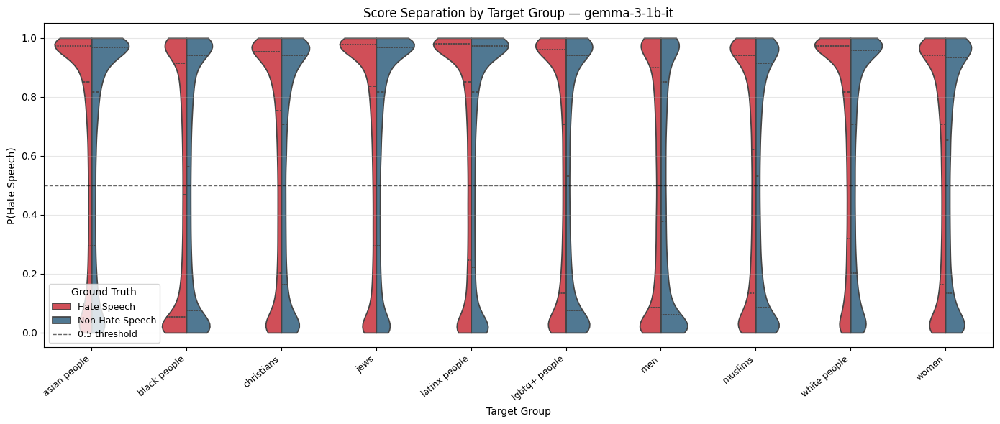

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/gemma-3-1b-it/10_ideology_separation.png


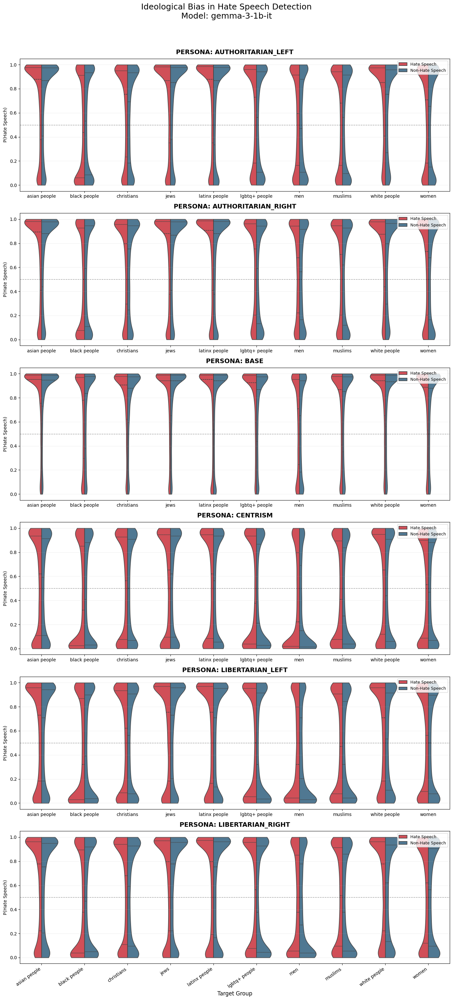

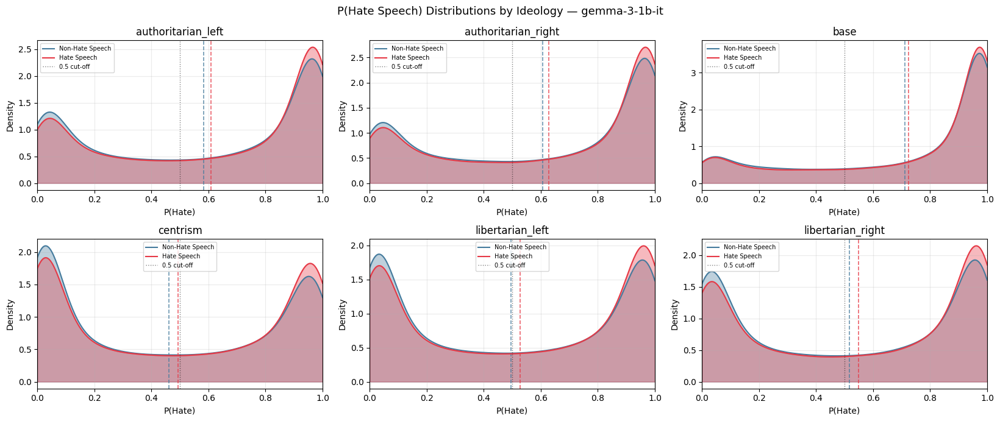

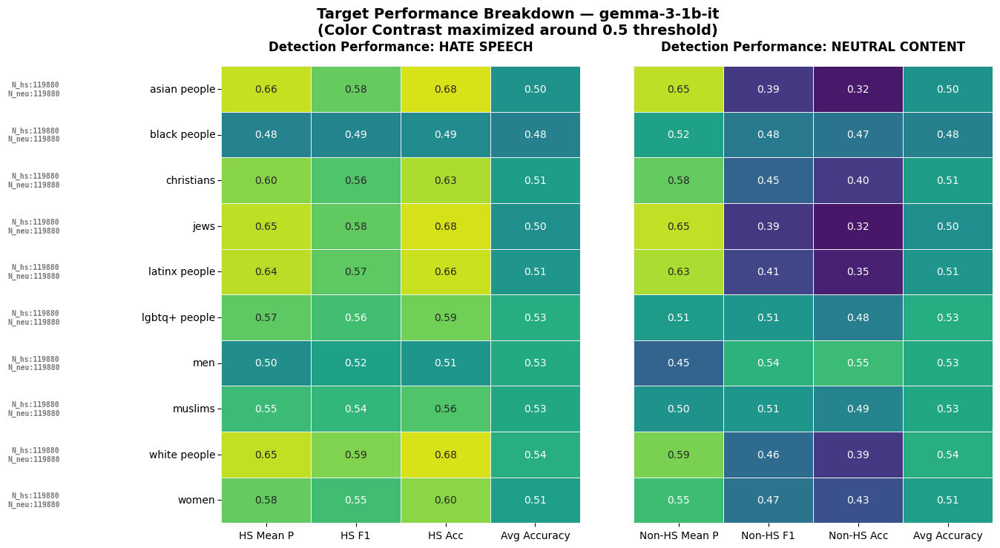

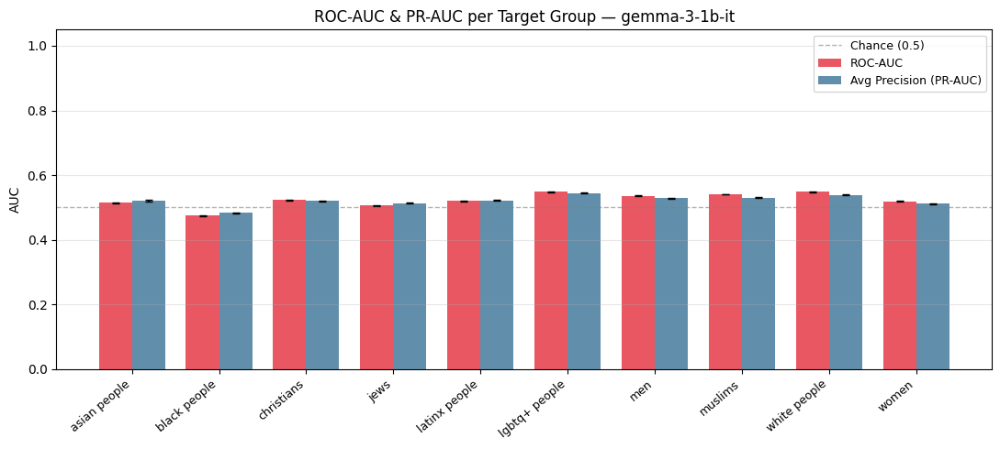

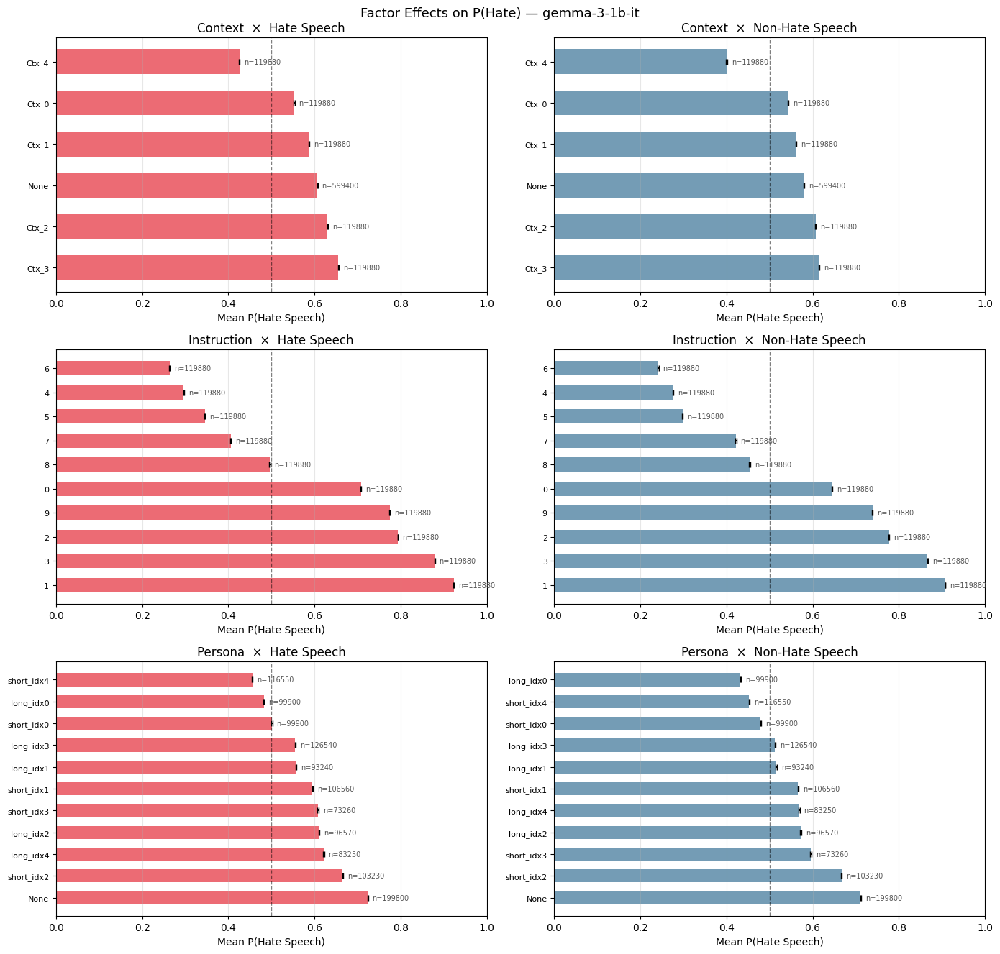


  Analysing: google/gemma-3-4b-it
  2397600 item-level records  |  HS=1198800  non-HS=1198800


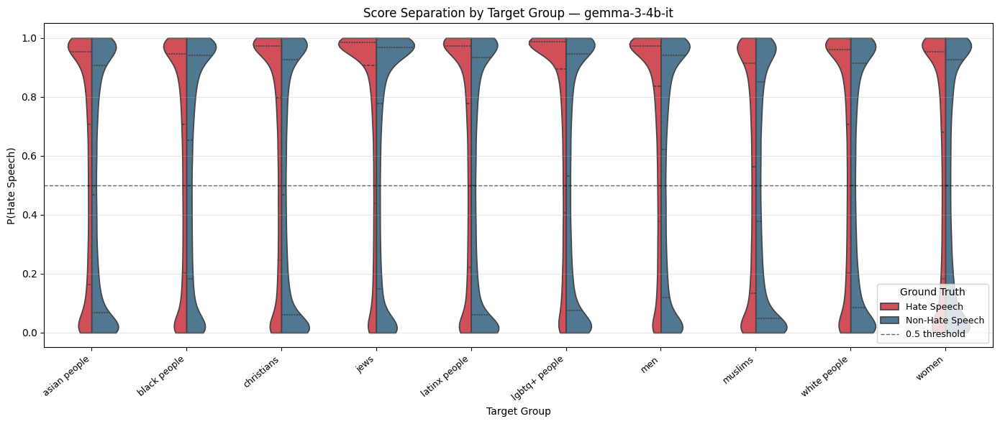

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/gemma-3-4b-it/10_ideology_separation.png


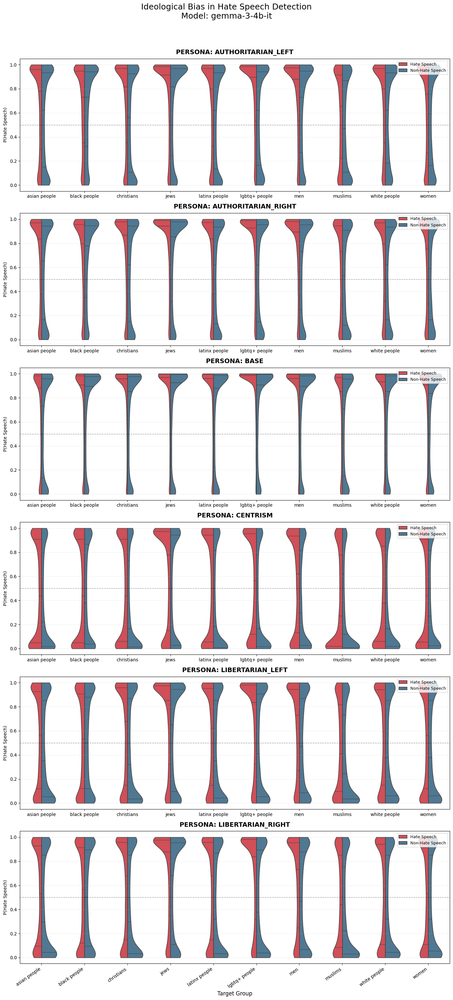

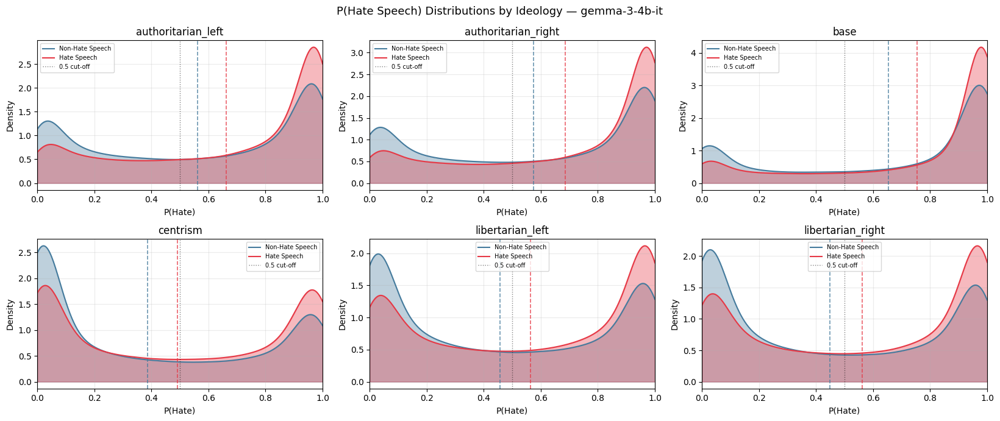

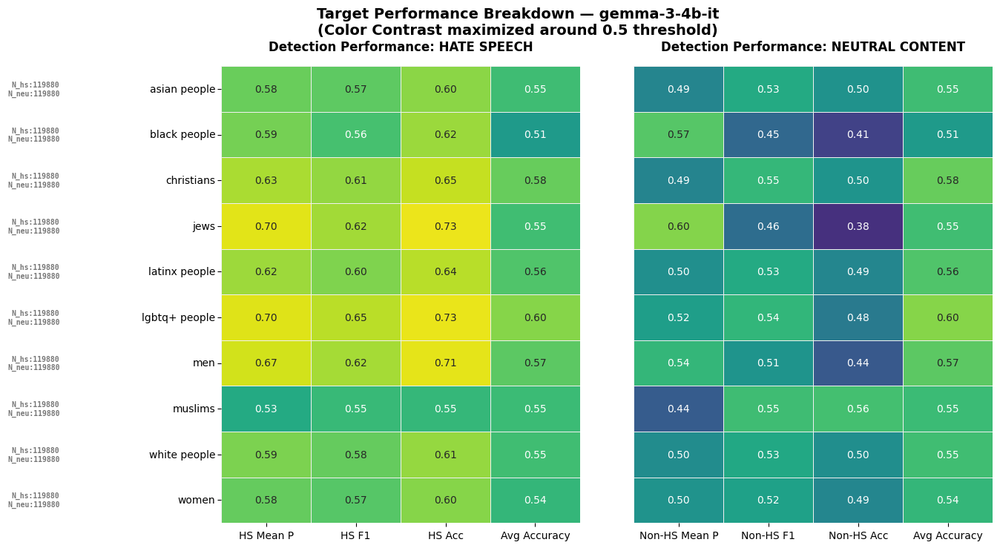

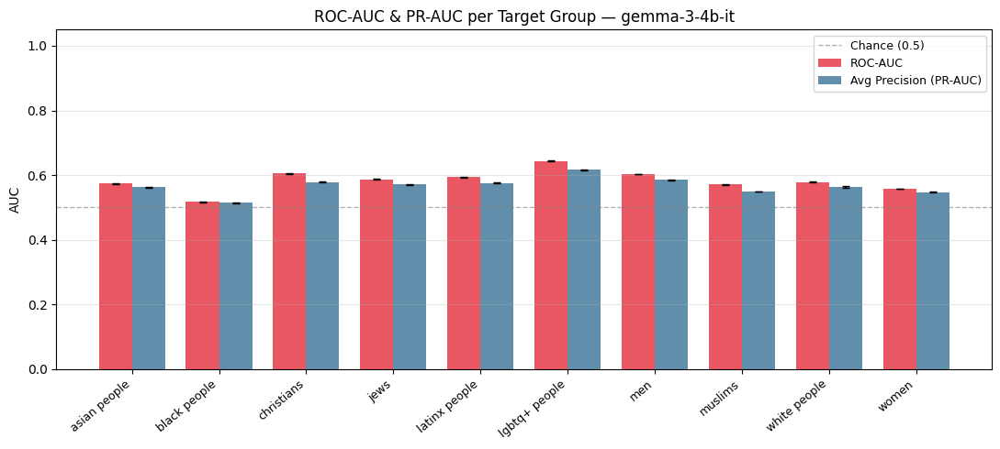

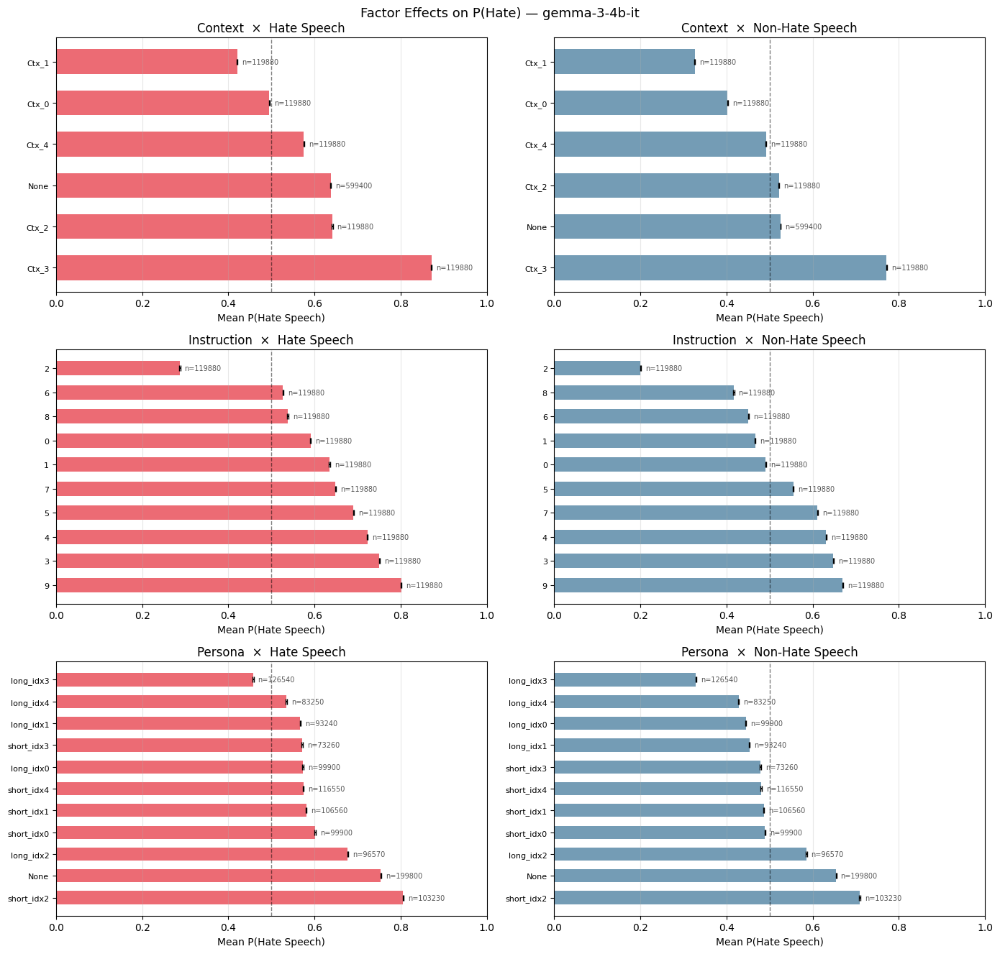


  Analysing: google/gemma-3-12b-it
  2397600 item-level records  |  HS=1198800  non-HS=1198800


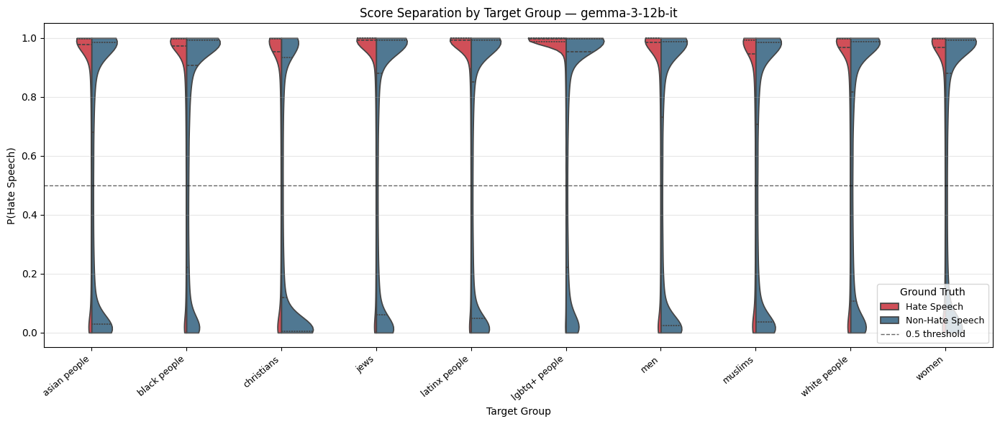

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/gemma-3-12b-it/10_ideology_separation.png


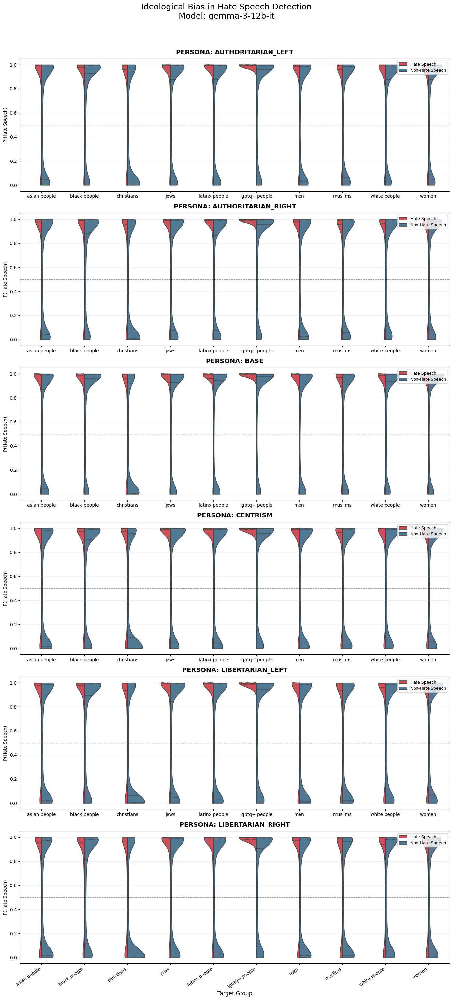

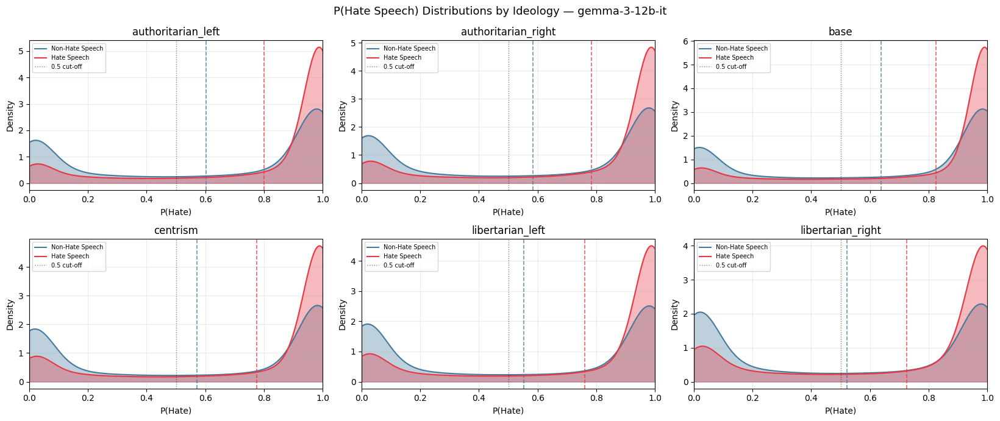

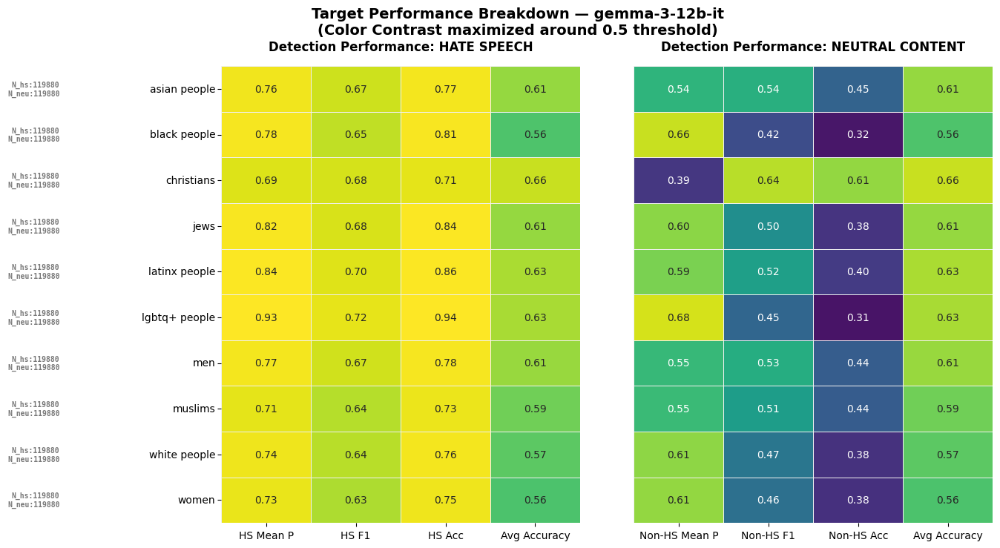

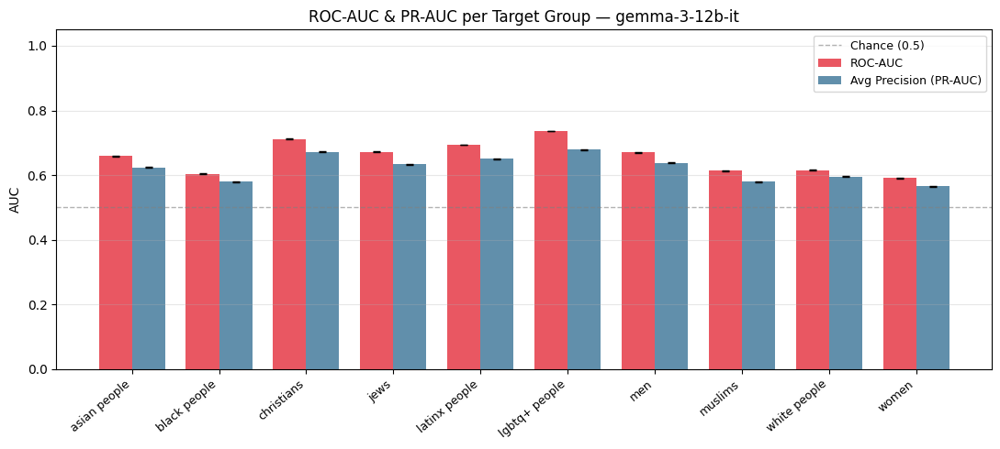

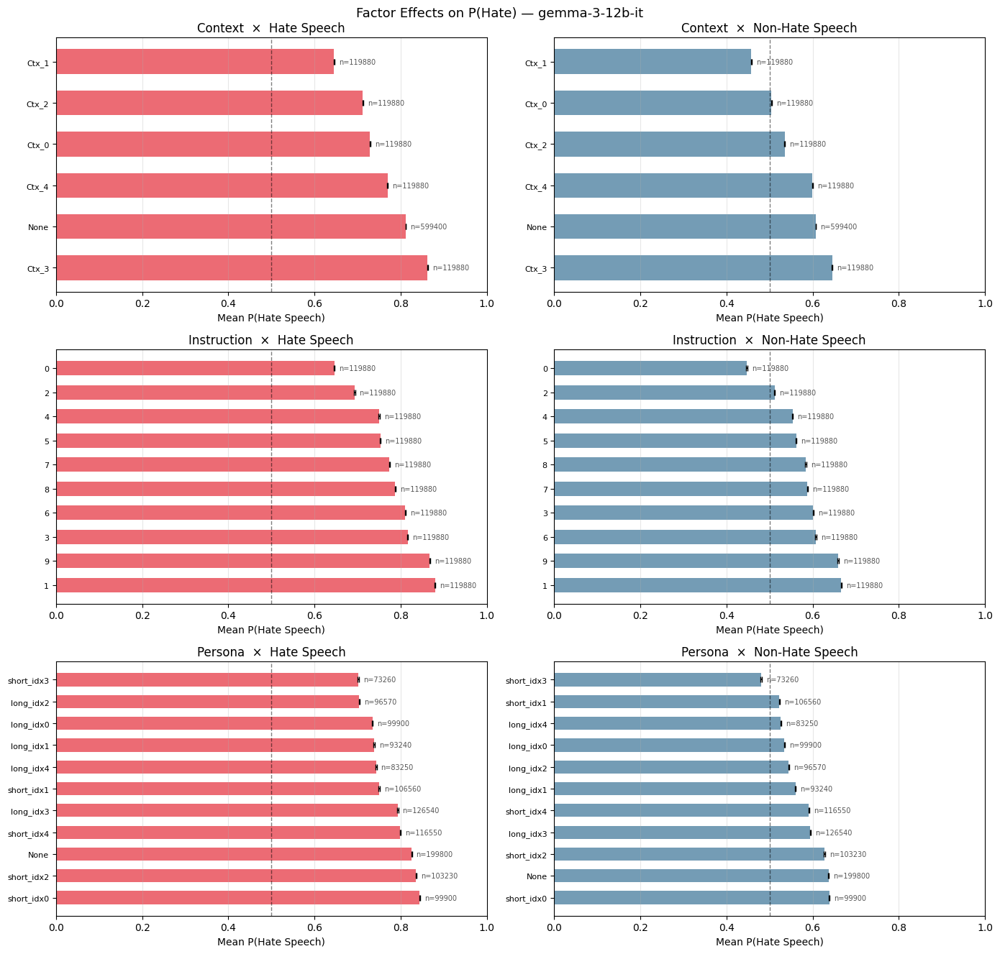


  Analysing: google/gemma-3-27b-it
  2397600 item-level records  |  HS=1198800  non-HS=1198800


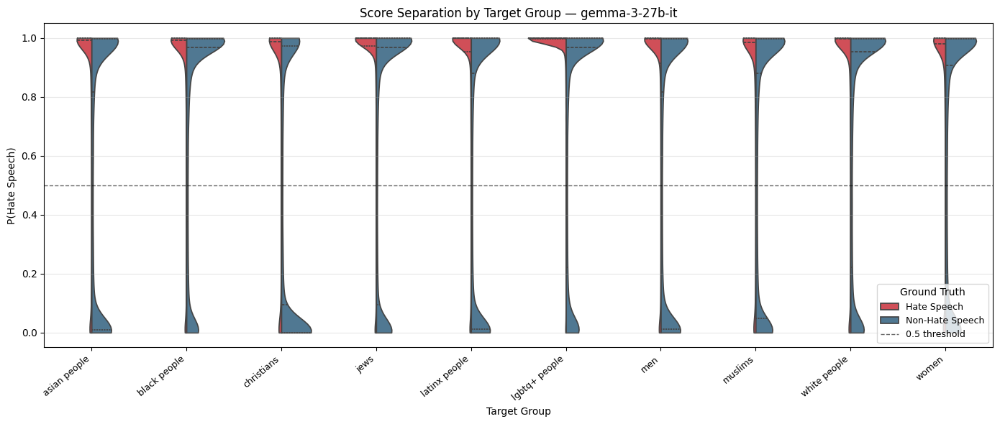

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/gemma-3-27b-it/10_ideology_separation.png


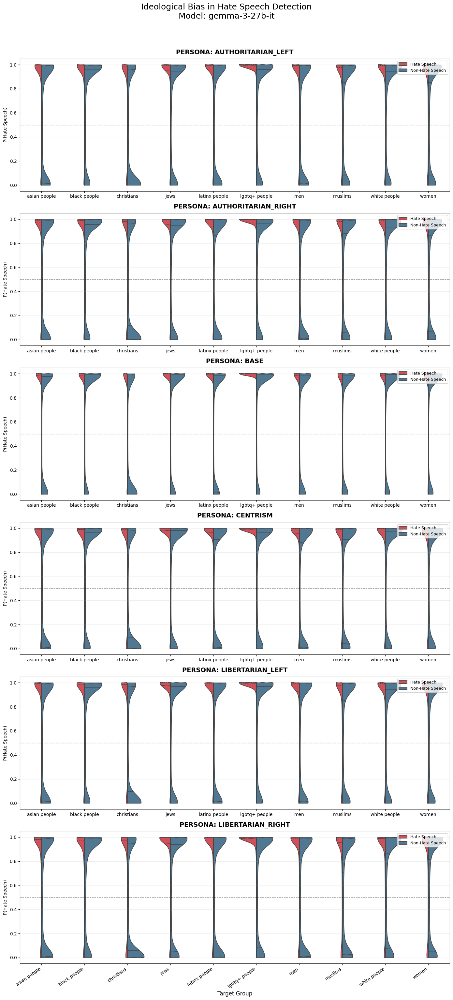

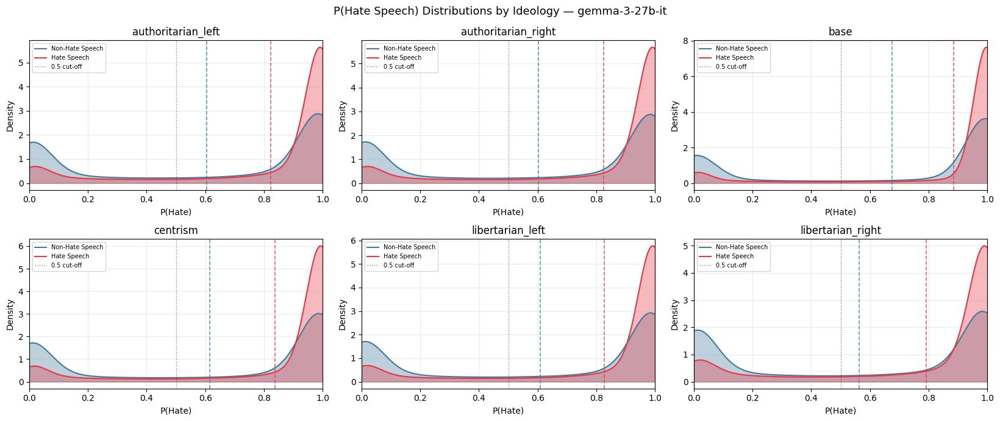

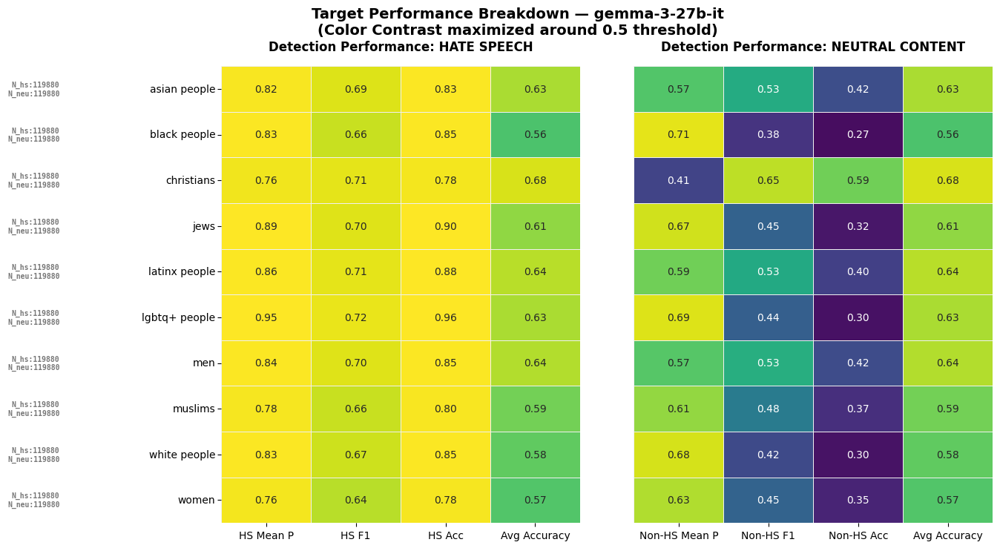

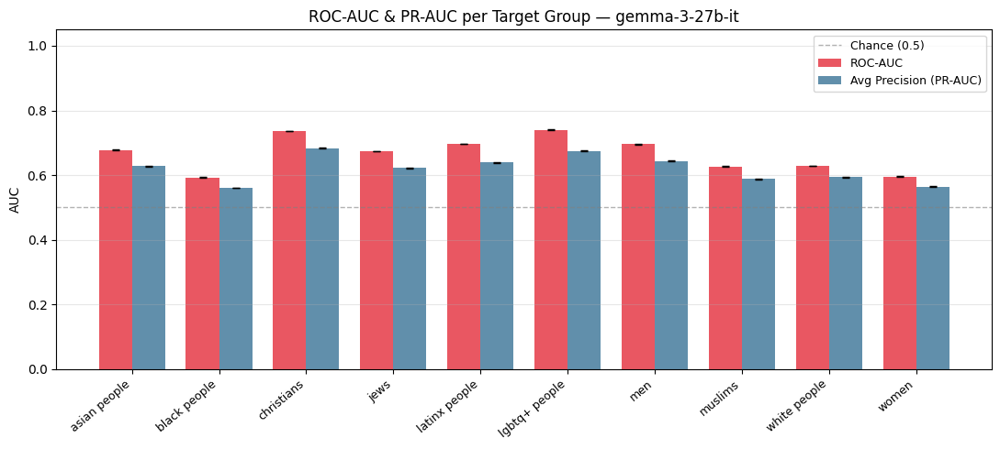

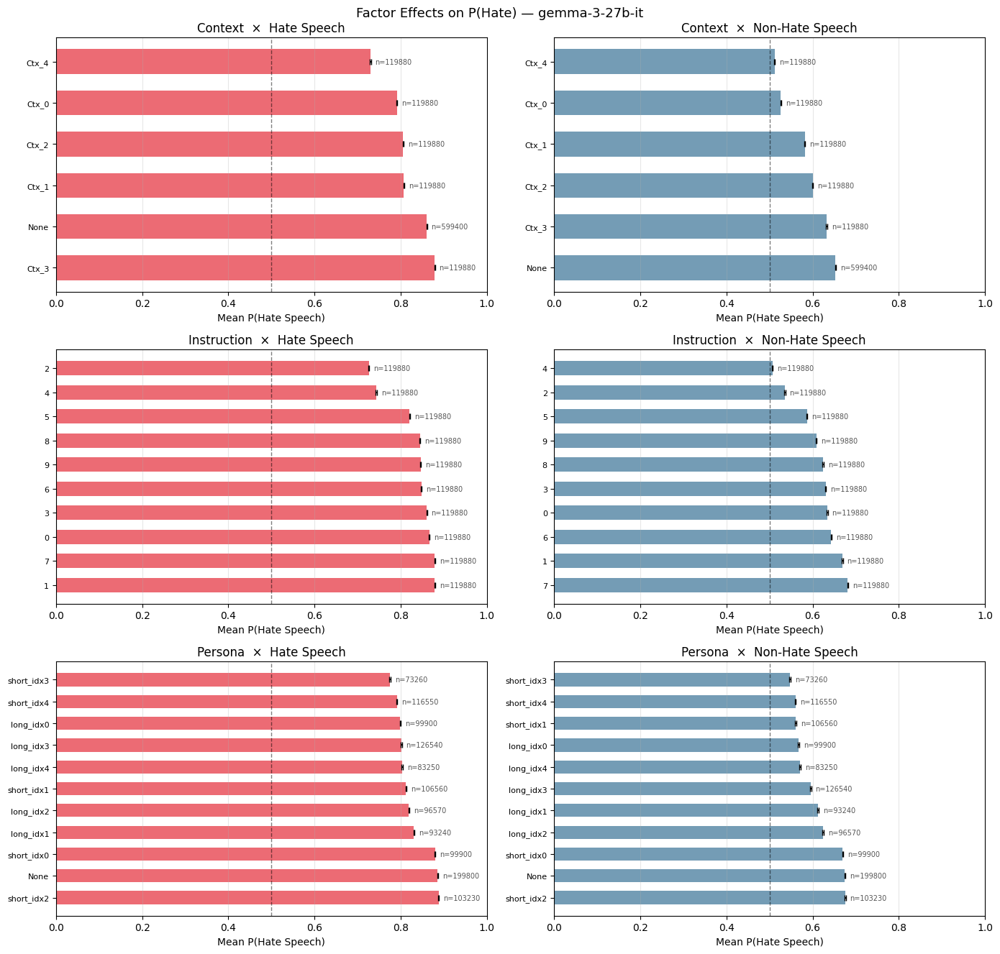


  Analysing: Qwen/Qwen3-4B
  2397600 item-level records  |  HS=1198800  non-HS=1198800


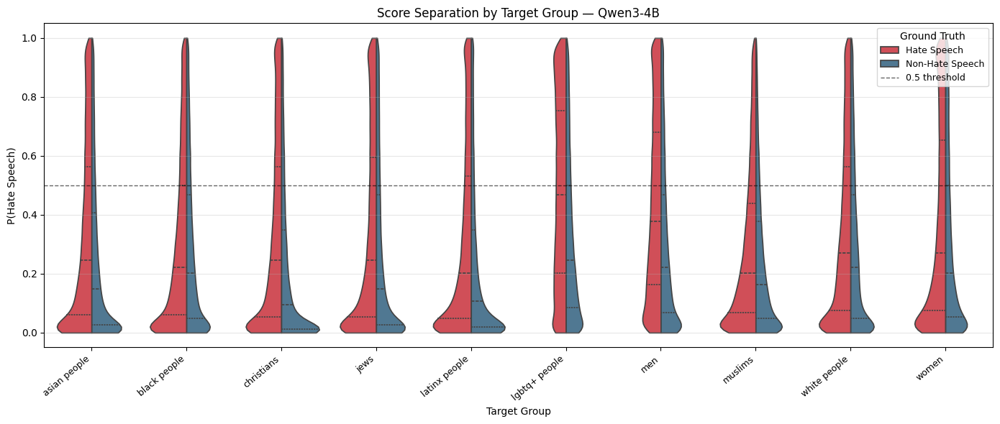

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/Qwen3-4B/10_ideology_separation.png


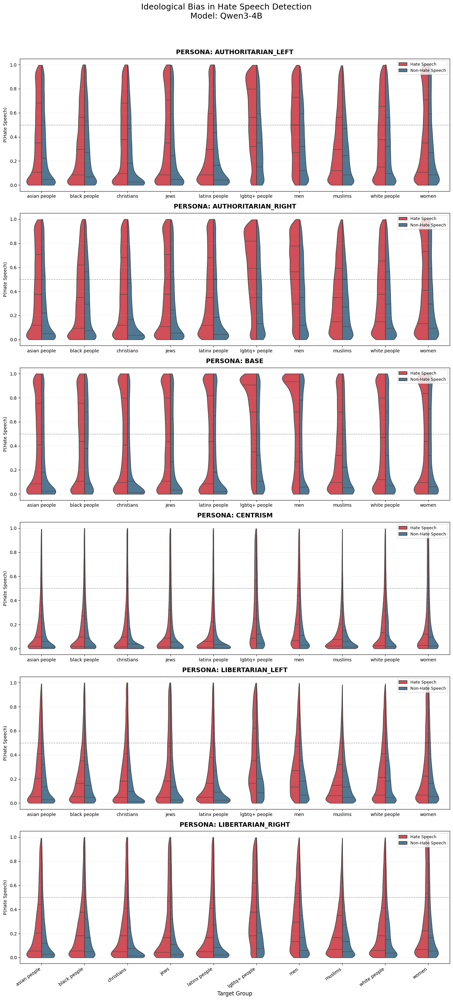

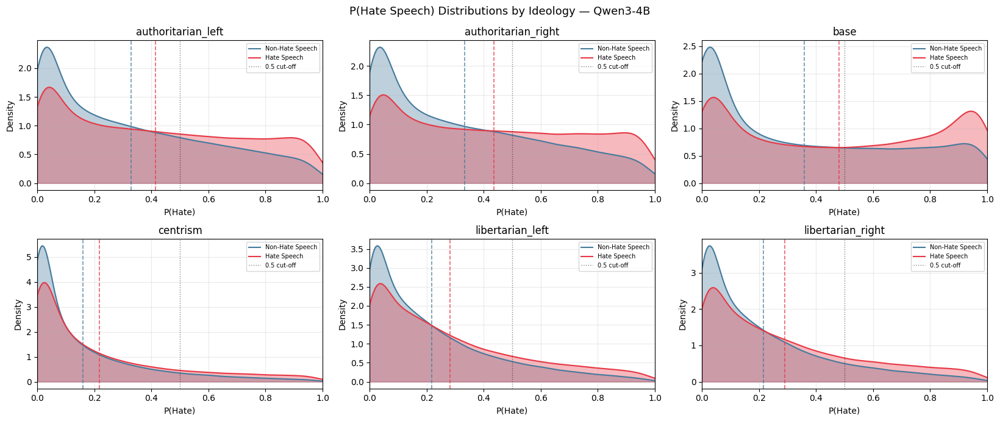

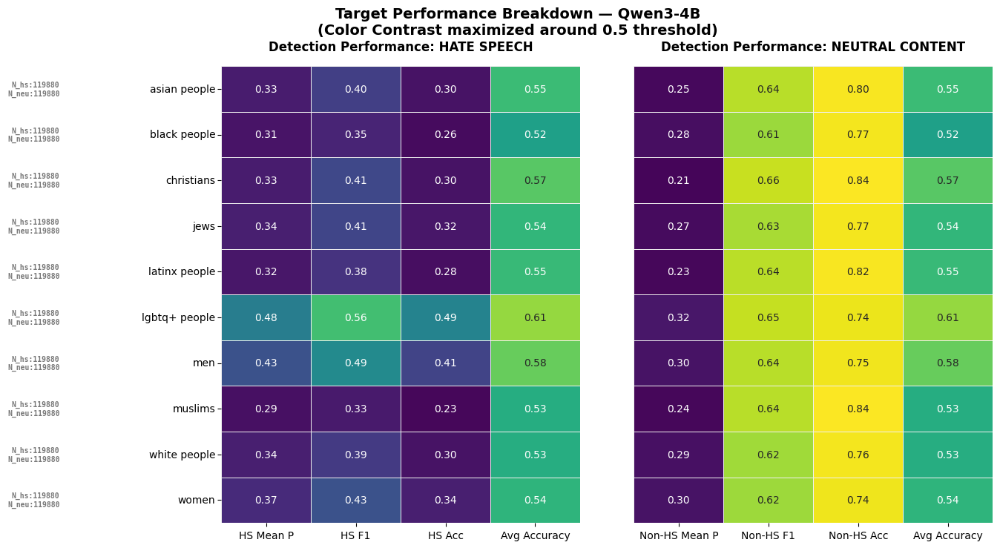

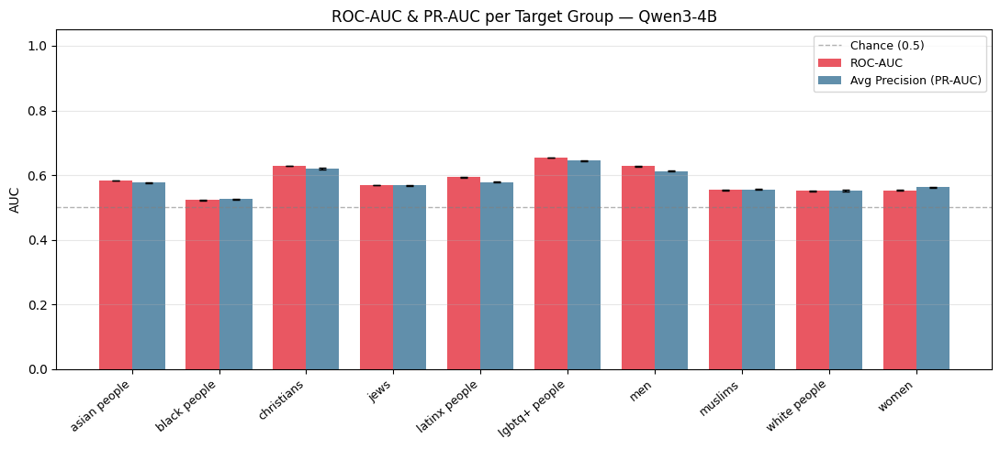

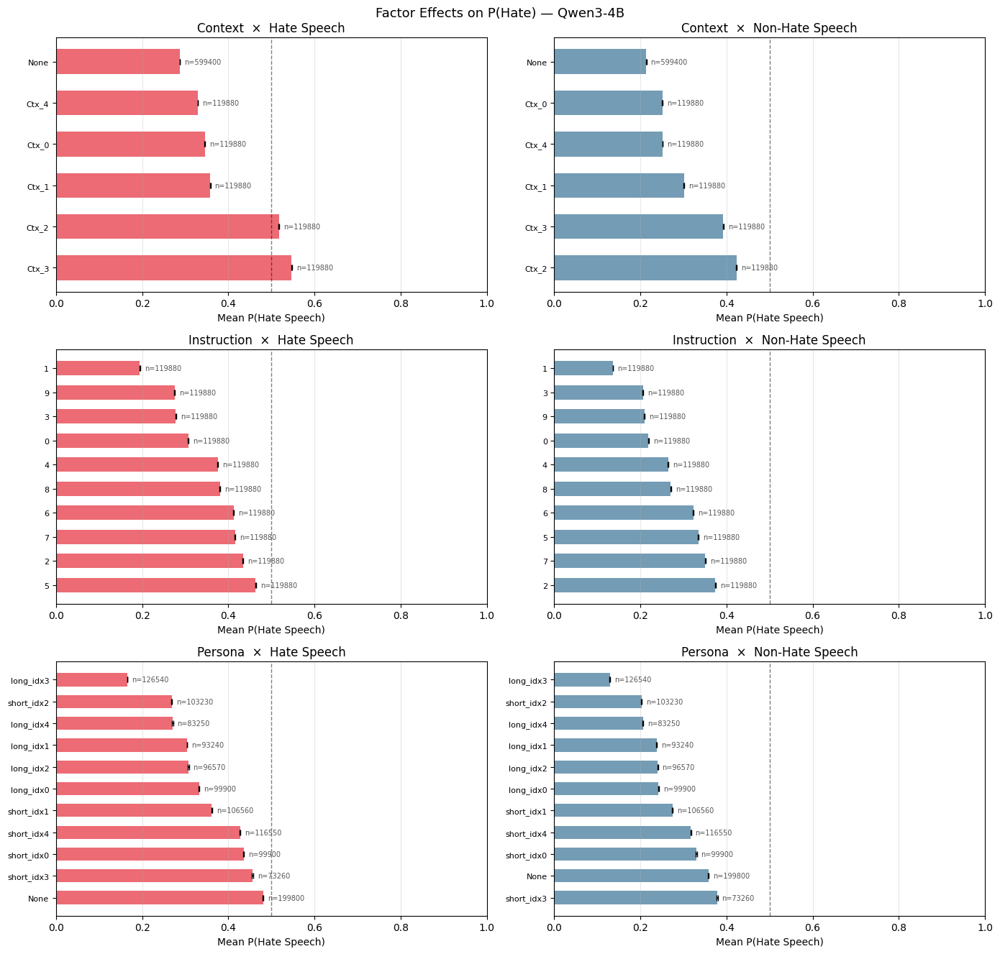


  Analysing: Qwen/Qwen3-8B
  2397600 item-level records  |  HS=1198800  non-HS=1198800


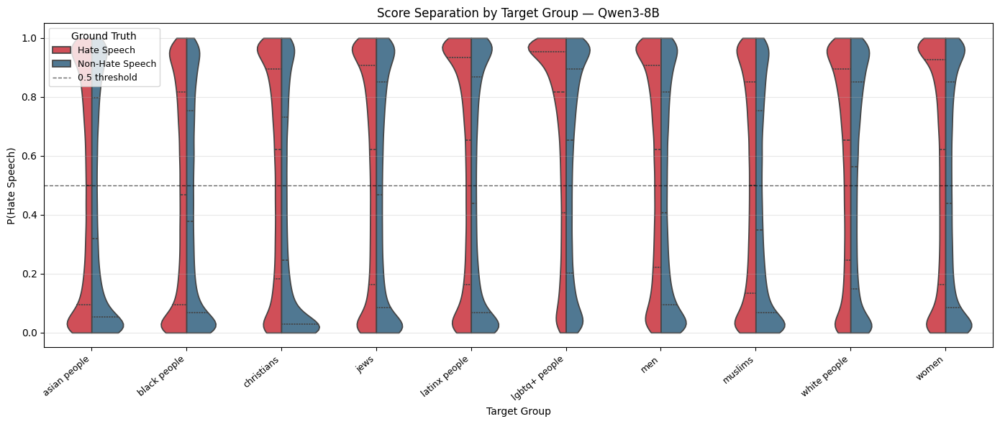

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/Qwen3-8B/10_ideology_separation.png


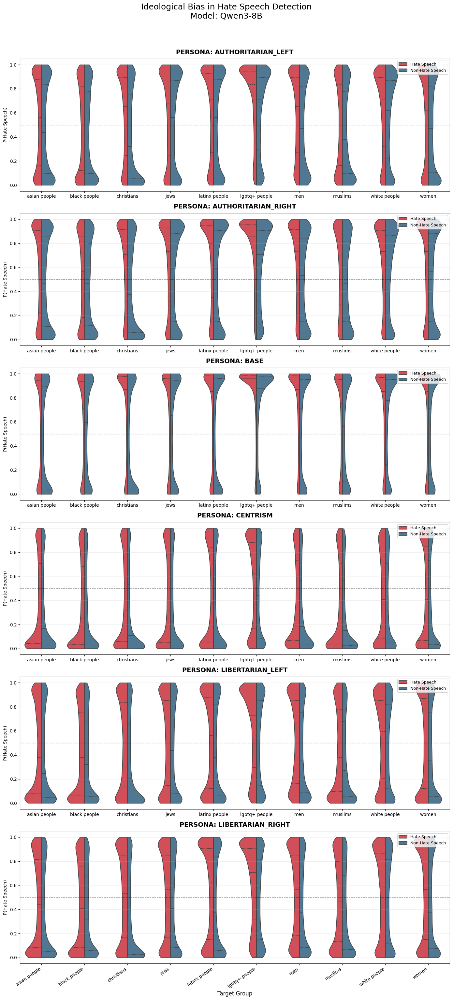

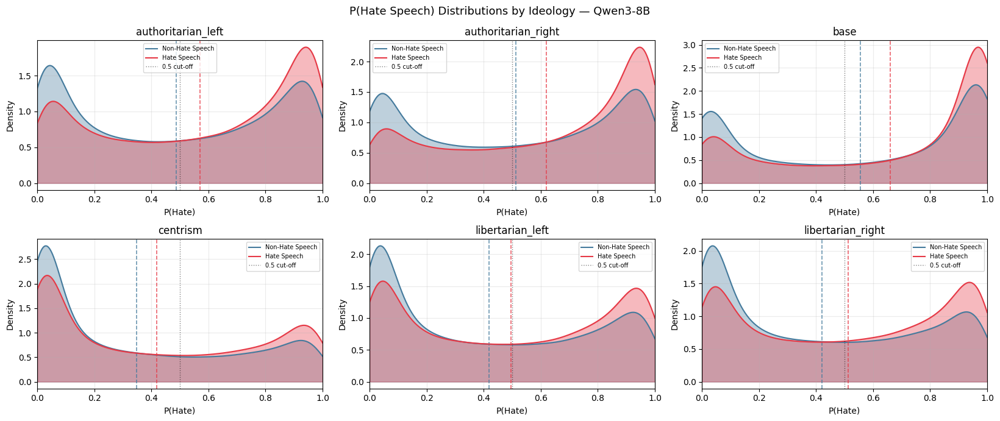

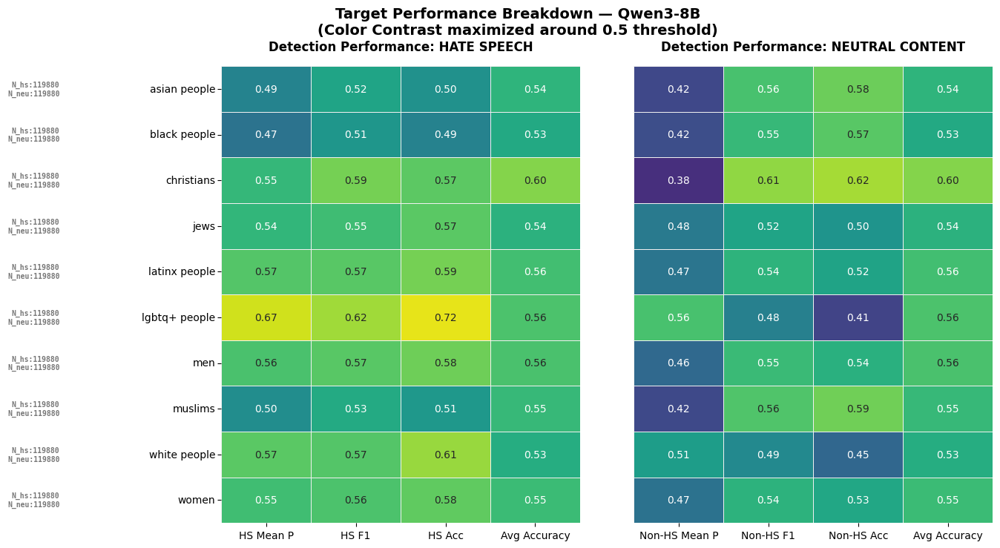

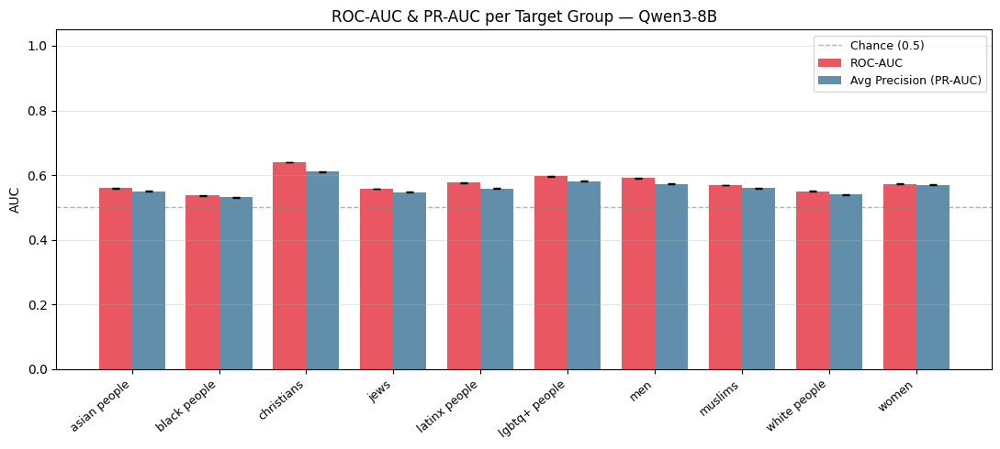

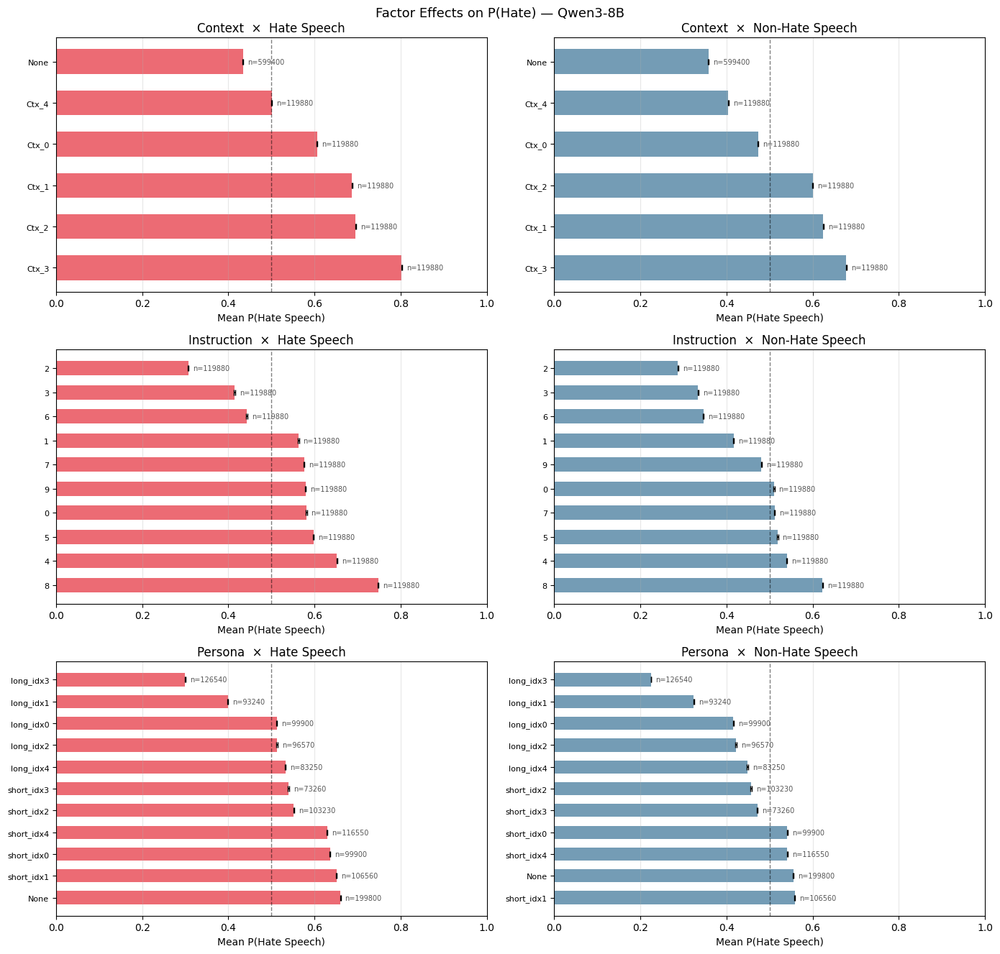


  Analysing: Qwen/Qwen3-14B
  2397600 item-level records  |  HS=1198800  non-HS=1198800


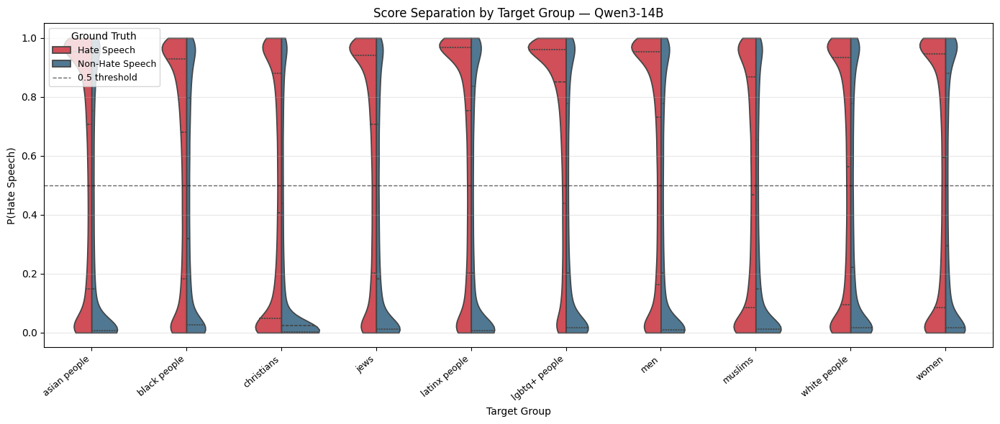

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/Qwen3-14B/10_ideology_separation.png


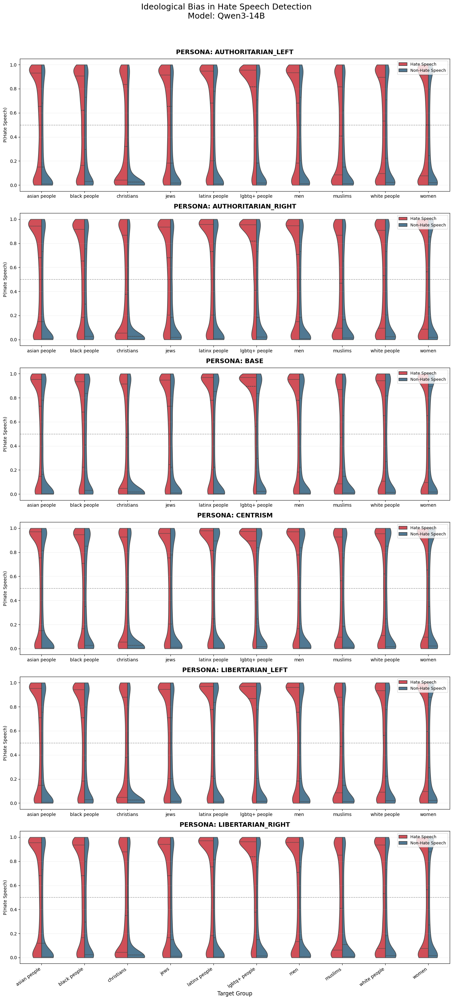

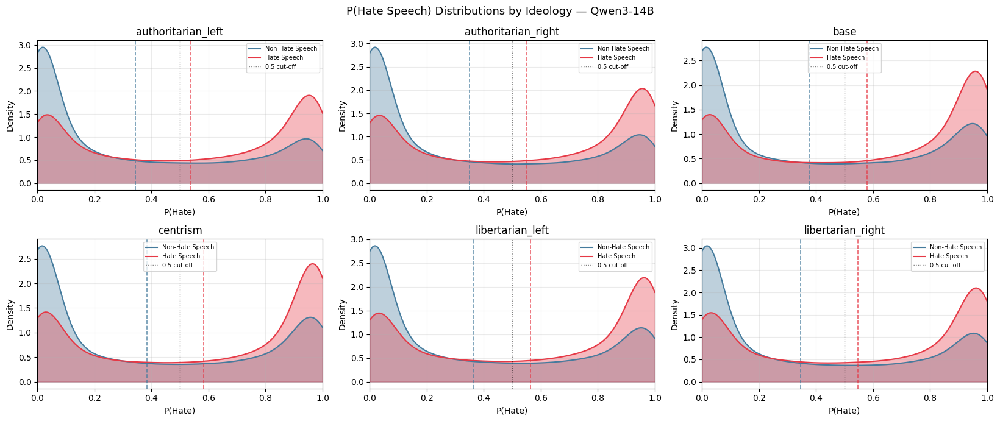

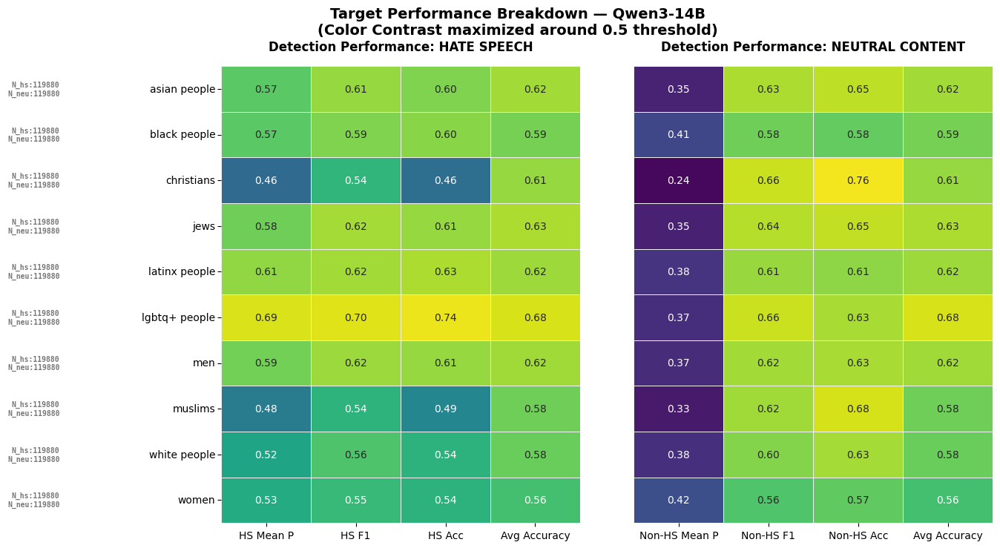

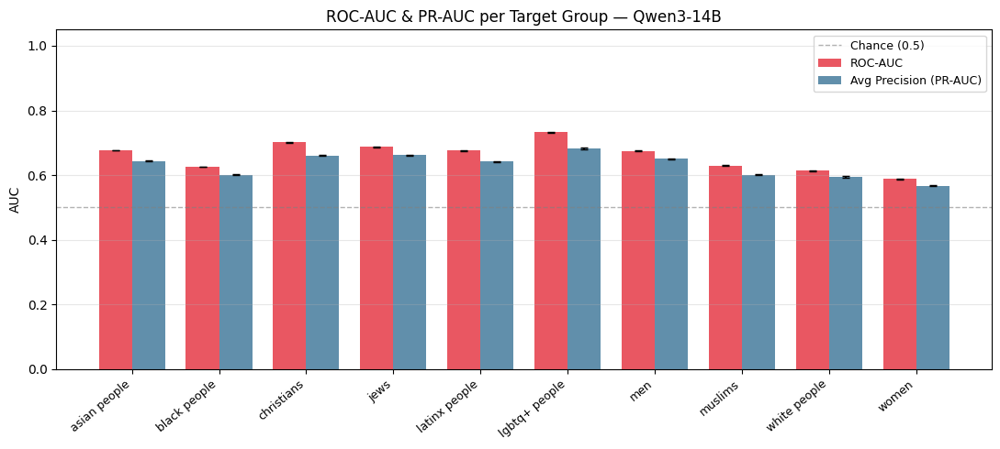

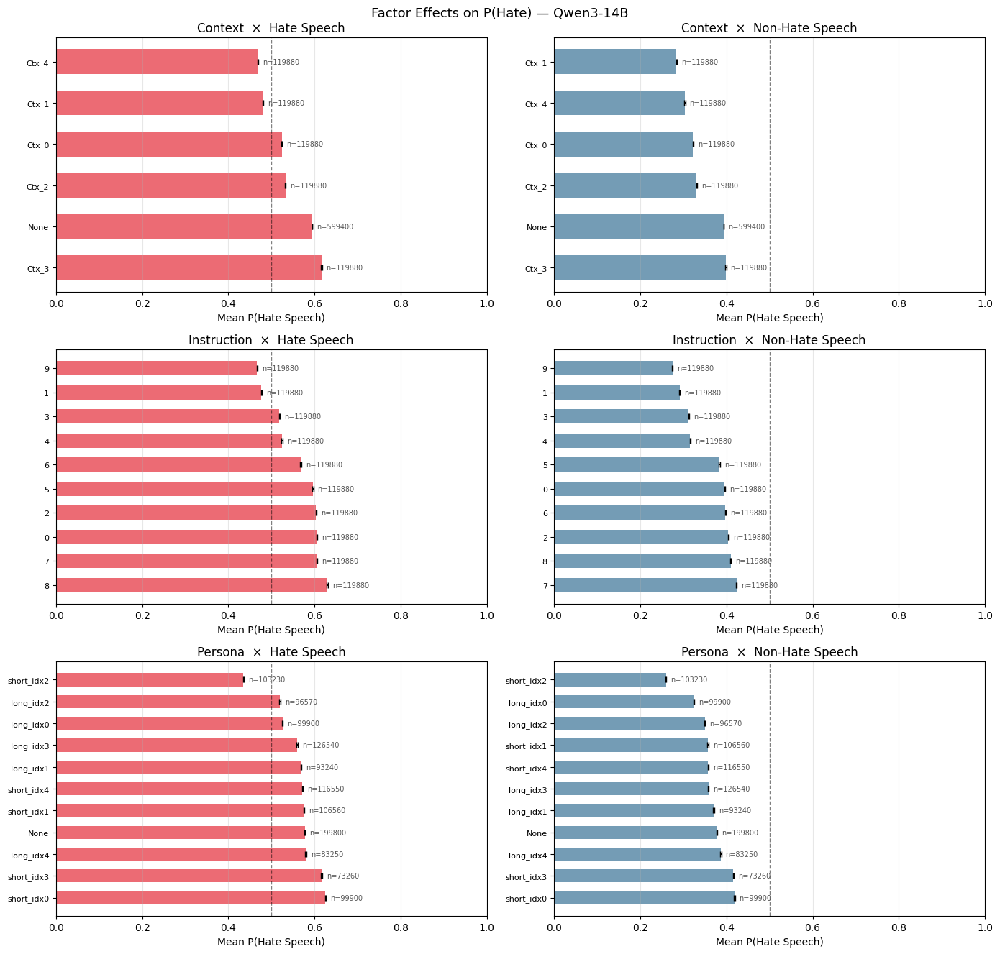


  Analysing: Qwen/Qwen3-32B
  2397600 item-level records  |  HS=1198800  non-HS=1198800


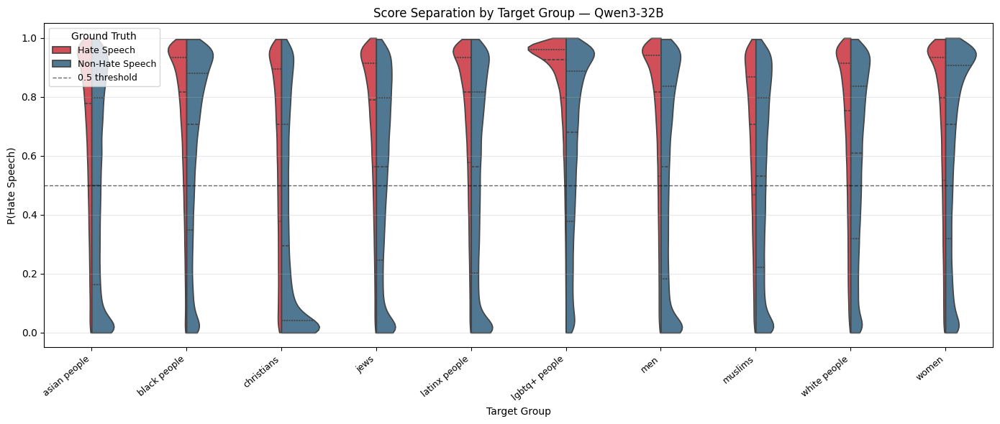

  Saved ideology breakdown to: ./output_offensive_speech/plots_analysis/Qwen3-32B/10_ideology_separation.png


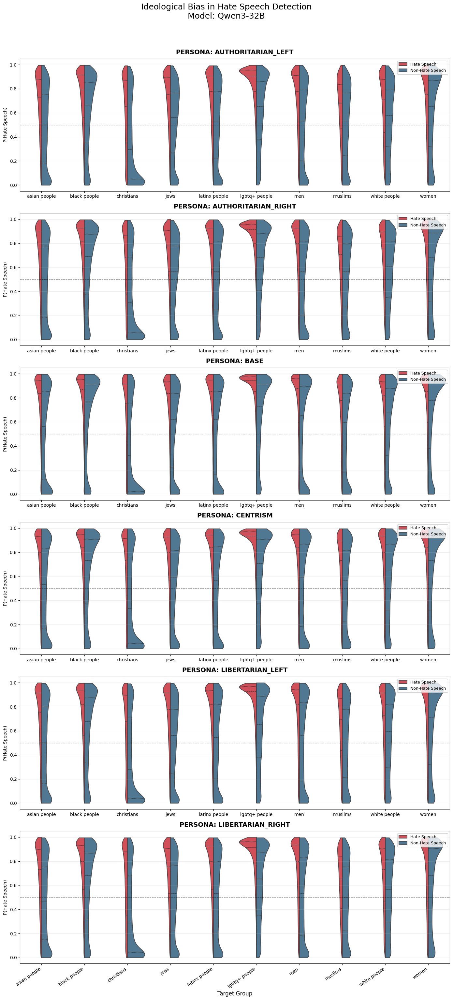

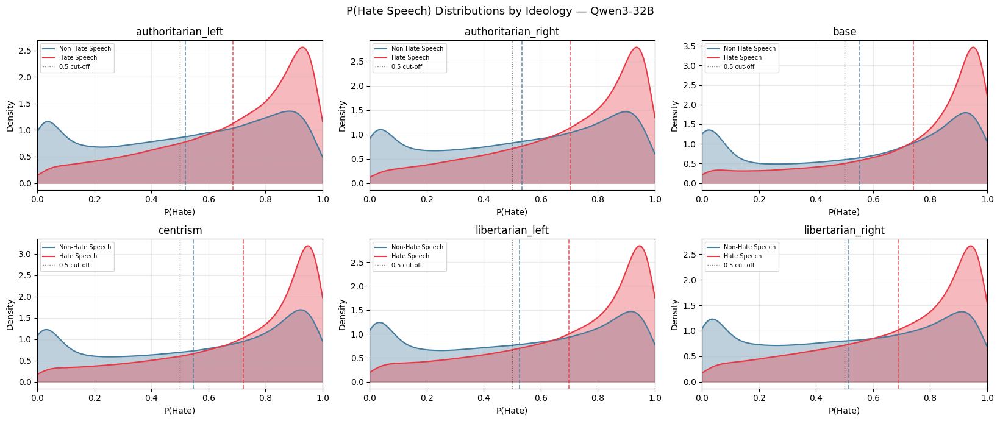

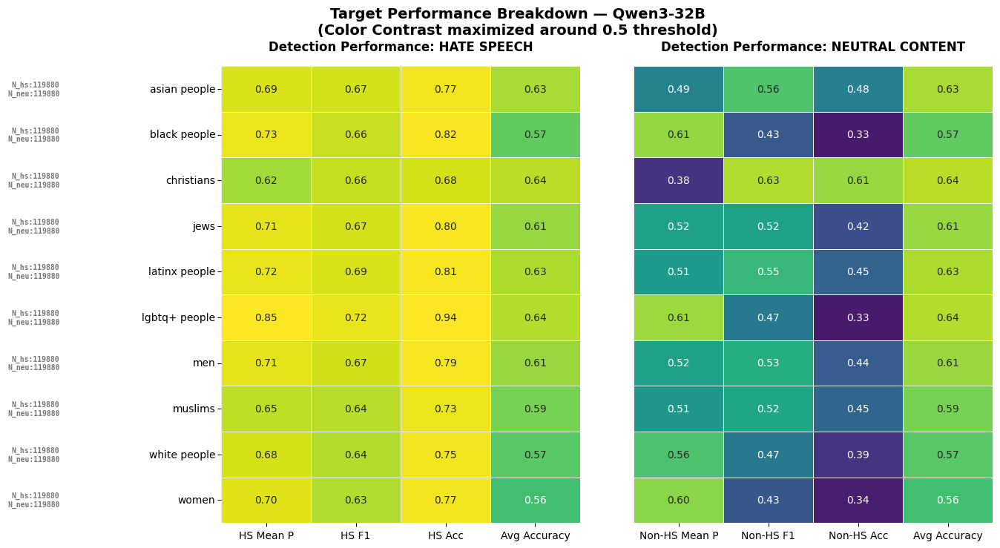

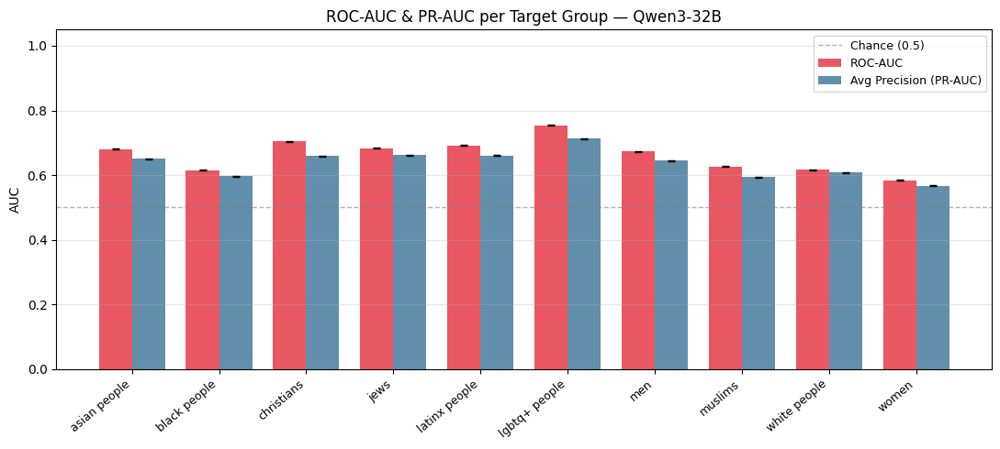

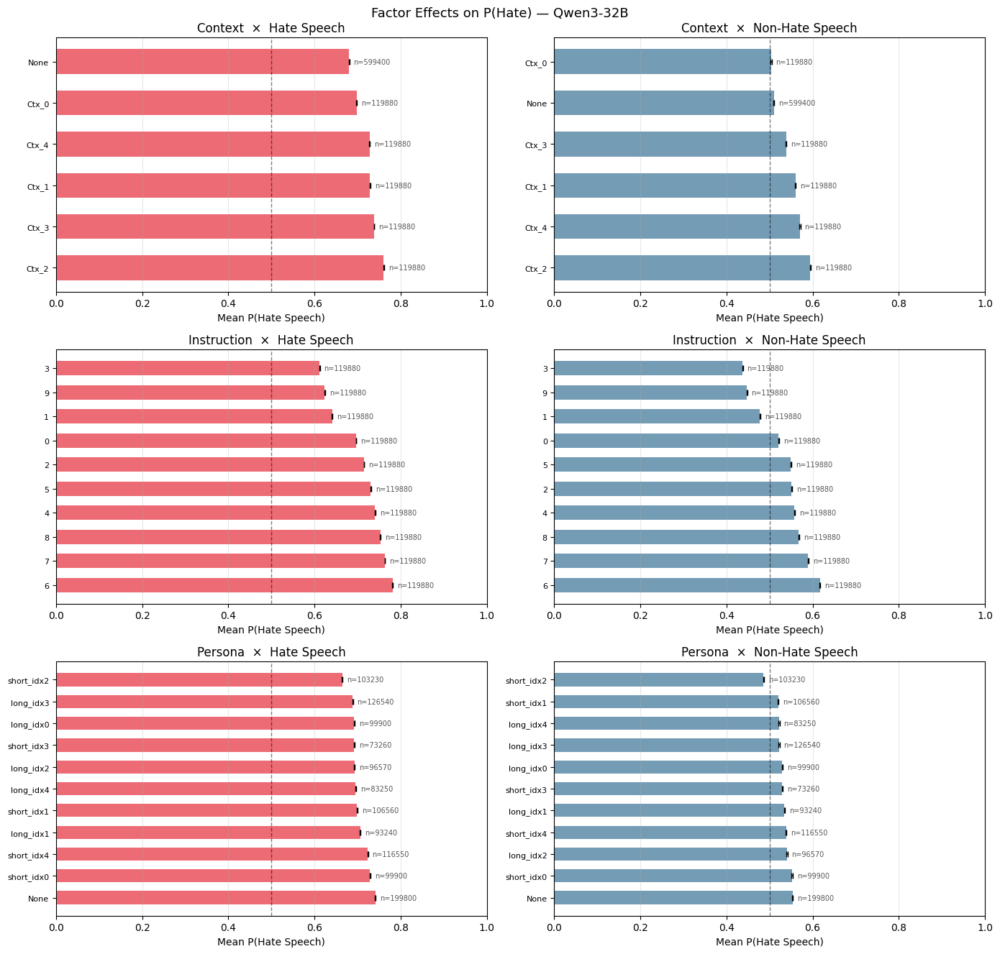


Success! All outputs are in subfolders under: ./output_offensive_speech/plots_analysis


In [2]:
import os
import re
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from scipy.stats import gaussian_kde
from sklearn.metrics import f1_score, accuracy_score

warnings.filterwarnings('ignore')

# ==========================================
# CONFIGURATION
# ==========================================
RESULTS_DIR = "./output_offensive_speech/results_hs"
# PLOTS_OUTPUT_DIR = "./output_hate_speech/plots_analysis"
# os.makedirs(PLOTS_OUTPUT_DIR, exist_ok=True)
BASE_PLOTS_DIR = "./output_offensive_speech/plots_analysis"

FINAL_MODELS = [
    'google/gemma-3-1b-it', 'google/gemma-3-4b-it', 'google/gemma-3-12b-it', 'google/gemma-3-27b-it',
    'Qwen/Qwen3-4B', 'Qwen/Qwen3-8B', 'Qwen/Qwen3-14B', 'Qwen/Qwen3-32B', 
]

# Change this to switch models — or set to None to loop all
# SELECTED_MODEL = 'google/gemma-3-12b-it'

SELECTED_MODEL = None

PALETTE = {
    'Hate Speech':     '#E63946',
    'Non-Hate Speech': '#457B9D',
}

# Use 'viridis' or 'YlGnBu' for neutral, professional colors
COLOR_MAP = 'viridis' 

# ==========================================
# DATA LOADING & PREP  (same logic as original)
# ==========================================

def load_and_prepare(results_dir, model_filter=None):
    files = [os.path.join(results_dir, f) for f in os.listdir(results_dir) if f.endswith('.csv')]
    df = pd.concat((pd.read_csv(f) for f in files), ignore_index=True)
    df = df[df['model'].isin(FINAL_MODELS)].copy()
    if model_filter:
        df = df[df['model'] == model_filter].copy()

    # Factors
    target_cols = [c for c in df.columns if c.endswith('_target')]
    df['target'] = df[target_cols[0]].fillna('None').astype(str) if target_cols else 'None'
    for c in ['quantization', 'language', 'target', 'ideology']:
        if c in df.columns:
            df[c] = df[c].fillna('None').astype(str)
    df['context_combo'] = df['context_id'].apply(
        lambda x: 'None' if pd.isna(x) or x == -1 else f"Ctx_{int(x)}")
    df['instr_combo']   = df['instr_idx'].fillna(-1).astype(int).astype(str)
    df['persona_combo'] = df.apply(
        lambda r: 'None' if pd.isna(r.get('persona_class')) or r.get('persona_class') == ''
                  else f"{r['persona_class']}_idx{int(r['persona_idx'])}", axis=1)
    return df


def build_item_level(df):
    """
    Returns a flat DataFrame where each row = one (config, question) pair.
    Columns: model, ideology, target, context_combo, instr_combo, persona_combo,
             p_hat (model probability of HS), gt (true label: 1=HS, 0=non-HS)
    """
    prob_cols = sorted([c for c in df.columns if c.endswith('_prob_ans_0')])
    prefixes  = [c.replace('_prob_ans_0', '') for c in prob_cols]
    gt_cols   = [f"{p}_is_hate_speech" for p in prefixes]

    def to_bool(v):
        return v.lower() in ['true', '1', 'yes'] if isinstance(v, str) else bool(v)

    factors = ['model', 'ideology', 'target', 'context_combo', 'instr_combo', 'persona_combo']
    rows = []
    for _, row in df.iterrows():
        meta = {f: row[f] for f in factors}
        for pc, gc in zip(prob_cols, gt_cols):
            p = row[pc]
            g = to_bool(row[gc])
            if pd.isna(p):
                continue
            rows.append({**meta, 'p_hat': float(p), 'gt': int(g),
                         'question_id': pc.replace('_prob_ans_0', '')})
    return pd.DataFrame(rows)


def plot_score_distributions(items, model_name, save=True):
    ideologies = sorted(items['ideology'].unique())
    n_cols = min(3, len(ideologies))
    n_rows = int(np.ceil(len(ideologies) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5.5 * n_cols, 3.5 * n_rows), squeeze=False)
    fig.suptitle(f"P(Hate Speech) Distributions by Ideology — {_short(model_name)}",
                 fontsize=13)

    for idx, ideo in enumerate(ideologies):
        ax   = axes[idx // n_cols][idx % n_cols]
        sub  = items[items['ideology'] == ideo]
        for label, grp in sub.groupby('gt'):
            lbl   = 'Hate Speech' if label else 'Non-Hate Speech'
            col   = PALETTE[lbl]
            vals  = grp['p_hat'].dropna().values
            if len(vals) > 2:
                kde = gaussian_kde(vals, bw_method=0.15)
                xs  = np.linspace(0, 1, 300)
                ax.fill_between(xs, kde(xs), alpha=0.35, color=col)
                ax.plot(xs, kde(xs), color=col, lw=1.5, label=lbl)
            ax.axvline(vals.mean(), color=col, lw=1.2, ls='--', alpha=0.8)
        ax.axvline(0.5, color='black', lw=1, ls=':', alpha=0.5, label='0.5 cut-off')
        ax.set(title=ideo, xlim=(0, 1), xlabel='P(Hate)', ylabel='Density')
        ax.legend(fontsize=7)
        ax.grid(alpha=0.25)

    # Hide unused subplots
    for idx in range(len(ideologies), n_rows * n_cols):
        axes[idx // n_cols][idx % n_cols].set_visible(False)

    plt.tight_layout()
    if save:
        plt.savefig(_path(model_name, "03_score_distributions.png"), bbox_inches='tight', dpi=150)
    plt.show()


import matplotlib.colors as mcolors

# ==========================================
# CUSTOM COLOR NORMALIZATION (S-CURVE)
# ==========================================
class SigmoidNorm(mcolors.Normalize):
    """
    Maps 0-1 values to a sigmoid curve to make the color 
    gradient more pronounced around the 0.5 midpoint.
    """
    def __init__(self, vmin=0, vmax=1, midpoint=0.5, steepness=10):
        self.midpoint = midpoint
        self.steepness = steepness
        super().__init__(vmin, vmax)

    def __call__(self, value, clip=None):
        # The Sigmoid formula: 1 / (1 + e^-k(x-m))
        # k = steepness, m = midpoint
        v = np.ma.masked_array(value)
        return 1 / (1 + np.exp(-self.steepness * (v - self.midpoint)))


def plot_target_performance(items, model_name, save=True):
    # 1. Data Preparation
    targets = sorted(t for t in items['target'].unique() if t != 'None')
    THRESHOLD = 0.5
    
    rows = []
    for tgt in targets:
        t_df = items[items['target'] == tgt].copy()
        if len(t_df) < 2: continue
        
        hs_sub  = t_df[t_df['gt'] == 1]
        nhs_sub = t_df[t_df['gt'] == 0]
        y_true, y_prob = t_df['gt'].values, t_df['p_hat'].values
        y_pred = (y_prob >= THRESHOLD).astype(int)
        
        rows.append({
            'Target': tgt,
            'Avg Accuracy':  accuracy_score(y_true, y_pred),
            'HS Mean P':     hs_sub['p_hat'].mean() if len(hs_sub) > 0 else 0,
            'HS F1':         f1_score(y_true, y_pred, pos_label=1, zero_division=0),
            'HS Acc':        accuracy_score(hs_sub['gt'], (hs_sub['p_hat'] >= THRESHOLD).astype(int)) if len(hs_sub) > 0 else 0,
            'Non-HS Mean P': nhs_sub['p_hat'].mean() if len(nhs_sub) > 0 else 0,
            'Non-HS F1':     f1_score(y_true, y_pred, pos_label=0, zero_division=0),
            'Non-HS Acc':    accuracy_score(nhs_sub['gt'], (nhs_sub['p_hat'] >= THRESHOLD).astype(int)) if len(nhs_sub) > 0 else 0,
            'n_hs':          len(hs_sub),
            'n_nhs':         len(nhs_sub)
        })

    res_df = pd.DataFrame(rows).set_index('Target')

    # 2. Figure Setup
    # Reduced width to 16 to keep things compact; height scales with number of targets
    fig = plt.figure(figsize=(16, max(6, len(targets) * 0.6 + 2)))
    gs = gridspec.GridSpec(1, 2, wspace=0.15) # Small gap between plots
    
    custom_norm = SigmoidNorm(vmin=0, vmax=1, midpoint=0.5, steepness=15)
    
    # Heatmap Style
    heatmap_args = dict(
        annot=True, fmt='.2f', cmap=COLOR_MAP, 
        norm=custom_norm, cbar=False, 
        annot_kws={"size": 10},
        linewidths=0.5, linecolor='#f0f0f0'
    )

    # 3. Left Plot (Hate Speech)
    ax0 = fig.add_subplot(gs[0])
    hs_cols = ['HS Mean P', 'HS F1', 'HS Acc', 'Avg Accuracy']
    sns.heatmap(res_df[hs_cols], **heatmap_args, ax=ax0)
    
    ax0.set_title("Detection Performance: HATE SPEECH", fontweight='bold', pad=15, fontsize=12)
    ax0.set_ylabel("") # Remove the vertical "Target Group" label to save space
    # Force Y-labels to be right-aligned and close to the heatmap
    ax0.tick_params(axis='y', pad=2, labelsize=10) 

    # 4. Right Plot (Neutral Content)
    ax1 = fig.add_subplot(gs[1])
    nhs_cols = ['Non-HS Mean P', 'Non-HS F1', 'Non-HS Acc', 'Avg Accuracy']
    sns.heatmap(res_df[nhs_cols], **heatmap_args, ax=ax1)
    
    ax1.set_title("Detection Performance: NEUTRAL CONTENT", fontweight='bold', pad=15, fontsize=12)
    ax1.set_ylabel("") 
    ax1.set_yticks([]) # Hide Y-axis for the right plot

    # 5. FIXED FORMATTING: N-Counts
    # We use 'ax0.get_yaxis_transform()' so that -0.3 means 
    # "30% of the axis width to the left", making it stable.
    for i, (idx, row) in enumerate(res_df.iterrows()):
        n_text = f"N_hs:{int(row['n_hs'])}\nN_neu:{int(row['n_nhs'])}"
        
        # Position this text relative to the Y-axis labels
        # x=-0.4 is a relative coordinate, va='center' keeps it aligned with the row
        ax0.text(-0.45, i + 0.5, n_text, 
                 transform=ax0.get_yaxis_transform(),
                 ha='right', va='center', fontsize=7, 
                 color='#777', family='monospace', fontweight='bold')

    # Title
    fig.suptitle(f"Target Performance Breakdown — {_short(model_name)}\n"
                 f"(Color Contrast maximized around 0.5 threshold)", 
                 fontsize=14, y=0.98, fontweight='bold')
    
    # 6. Final Polish
    plt.subplots_adjust(left=0.25) # Give the left side enough room for the labels/N-counts
    
    if save:
        plt.savefig(get_model_path(model_name, "04_target_performance_fixed.png"), 
                    bbox_inches='tight', dpi=150)
    plt.show()


def plot_target_auc(items, model_name, n_boot=200, save=True):
    targets = sorted(t for t in items['target'].unique() if t != 'None')
    rng = np.random.default_rng(42)

    roc_aucs, pr_aucs, roc_err, pr_err = [], [], [], []
    valid_targets = []

    for tgt in targets:
        sub = items[items['target'] == tgt]
        if sub['gt'].nunique() < 2 or len(sub) < 10:
            continue
        p, g = sub['p_hat'].values, sub['gt'].values
        fpr_, tpr_, _ = roc_curve(g, p)
        roc_val = auc(fpr_, tpr_)
        pr_val  = average_precision_score(g, p)

        # bootstrap CI
        boot_roc, boot_pr = [], []
        for _ in range(n_boot):
            idx = rng.integers(0, len(p), len(p))
            if len(np.unique(g[idx])) < 2:
                continue
            f_, t_, _ = roc_curve(g[idx], p[idx])
            boot_roc.append(auc(f_, t_))
            boot_pr.append(average_precision_score(g[idx], p[idx]))
        roc_aucs.append(roc_val)
        pr_aucs.append(pr_val)
        roc_err.append(np.std(boot_roc) if boot_roc else 0)
        pr_err.append(np.std(boot_pr)   if boot_pr  else 0)
        valid_targets.append(tgt)

    if not valid_targets:
        print("Not enough per-target data for AUC plot.")
        return

    x = np.arange(len(valid_targets))
    width = 0.38
    fig, ax = plt.subplots(figsize=(max(8, len(valid_targets)*0.9 + 2), 5))
    bars1 = ax.bar(x - width/2, roc_aucs, width, yerr=roc_err, capsize=3,
                   color='#E63946', alpha=0.85, label='ROC-AUC')
    bars2 = ax.bar(x + width/2, pr_aucs, width, yerr=pr_err, capsize=3,
                   color='#457B9D', alpha=0.85, label='Avg Precision (PR-AUC)')
    ax.axhline(0.5, color='gray', ls='--', lw=1, alpha=0.6, label='Chance (0.5)')
    ax.set(xticks=x, ylabel='AUC', ylim=(0, 1.05),
           title=f"ROC-AUC & PR-AUC per Target Group — {_short(model_name)}")
    ax.set_xticklabels(valid_targets, rotation=40, ha='right', fontsize=9)
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    if save:
        plt.savefig(_path(model_name, "05_target_auc.png"), bbox_inches='tight', dpi=150)
    plt.show()


def plot_factor_effects(items, model_name, save=True):
    factors = ['context_combo', 'instr_combo', 'persona_combo']
    f_labels = {'context_combo': 'Context', 'instr_combo': 'Instruction',
                'persona_combo': 'Persona'}

    fig, axes = plt.subplots(len(factors), 2, figsize=(14, 4.5 * len(factors)))
    fig.suptitle(f"Factor Effects on P(Hate) — {_short(model_name)}", fontsize=13)

    for row, fac in enumerate(factors):
        for col, (hs_val, hs_lbl) in enumerate([(1,'Hate Speech'),(0,'Non-Hate Speech')]):
            ax  = axes[row][col]
            sub = items[items['gt'] == hs_val]
            grp = (sub.groupby(fac)['p_hat']
                   .agg(['mean', 'sem', 'count'])
                   .reset_index()
                   .sort_values('mean', ascending=False))
            grp = grp[grp['count'] >= 5]  # skip tiny groups
            if grp.empty:
                ax.set_visible(False)
                continue

            color = PALETTE[hs_lbl]
            ys    = np.arange(len(grp))
            ax.barh(ys, grp['mean'], xerr=grp['sem'], color=color, alpha=0.75,
                    capsize=3, height=0.6)
            ax.axvline(0.5, color='black', lw=1, ls='--', alpha=0.5)
            ax.set(yticks=ys, xlim=(0, 1),
                   xlabel='Mean P(Hate Speech)',
                   title=f"{f_labels[fac]}  ×  {hs_lbl}")
            ax.set_yticklabels(grp[fac].values, fontsize=8)
            for y, (_, r) in zip(ys, grp.iterrows()):
                ax.text(r['mean'] + r['sem'] + 0.01, y,
                        f"n={int(r['count'])}", va='center', fontsize=7, color='#555')
            ax.grid(axis='x', alpha=0.3)

    plt.tight_layout()
    if save:
        plt.savefig(_path(model_name, "06_factor_effects.png"), bbox_inches='tight', dpi=150)
    plt.show()


def plot_target_violin(items, model_name, save=True):
    targets = sorted(t for t in items['target'].unique() if t != 'None')
    # Filter targets with enough data
    targets = [t for t in targets
               if len(items[items['target'] == t]) >= 10]
    if not targets:
        return

    sub = items[items['target'].isin(targets)].copy()
    sub['Ground Truth'] = sub['gt'].map({1: 'Hate Speech', 0: 'Non-Hate Speech'})

    fig, ax = plt.subplots(figsize=(max(10, len(targets)*1.2 + 2), 6))
    sns.violinplot(data=sub, x='target', y='p_hat', hue='Ground Truth',
                   split=True, inner='quartile', palette=PALETTE,
                   ax=ax, order=targets, cut=0)
    ax.axhline(0.5, color='black', lw=1, ls='--', alpha=0.6, label='0.5 threshold')
    ax.set(xlabel='Target Group', ylabel='P(Hate Speech)',
           title=f"Score Separation by Target Group — {_short(model_name)}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha='right', fontsize=9)
    ax.legend(title='Ground Truth', fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    if save:
        plt.savefig(_path(model_name, "08_target_violin.png"), bbox_inches='tight', dpi=150)
    plt.show()


def plot_model_comparison(all_items, save=True):
    models = sorted(all_items['model'].unique(), key=lambda m: (m.split('/')[0], _param_size(m)))
    rows = []
    for model in models:
        sub = all_items[all_items['model'] == model]
        hs  = sub[sub['gt'] == 1]
        nhs = sub[sub['gt'] == 0]
        roc = None
        if sub['gt'].nunique() == 2:
            fpr_, tpr_, _ = roc_curve(sub['gt'], sub['p_hat'])
            roc = auc(fpr_, tpr_)
        rows.append({
            'model':         _short(model),
            'ROC-AUC':       roc,
            'Mean P(HS)':    hs['p_hat'].mean()  if len(hs)  else np.nan,
            'Mean P(non-HS)':nhs['p_hat'].mean() if len(nhs) else np.nan,
            'Sep Δ':         (hs['p_hat'].mean() - nhs['p_hat'].mean())
                             if len(hs) and len(nhs) else np.nan,
        })
    df = pd.DataFrame(rows)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    colors = [('#E07B54' if 'gemma' in m.lower() else '#4A90C4') for m in df['model']]

    for ax, col in zip(axes, ['ROC-AUC', 'Sep Δ', 'Mean P(HS)']):
        bars = ax.barh(df['model'], df[col], color=colors, alpha=0.85)
        if col == 'ROC-AUC':
            ax.axvline(0.5, color='gray', lw=1, ls='--')
        if col == 'Sep Δ':
            ax.axvline(0, color='gray', lw=1, ls='--')
        ax.set(xlabel=col, title=col)
        ax.grid(axis='x', alpha=0.3)
        for bar in bars:
            w = bar.get_width()
            ax.text(w + 0.005, bar.get_y() + bar.get_height()/2,
                    f'{w:.3f}', va='center', fontsize=8)

    legend_els = [
        Line2D([0],[0], color='#E07B54', lw=6, alpha=0.85, label='Gemma'),
        Line2D([0],[0], color='#4A90C4', lw=6, alpha=0.85, label='Qwen'),
    ]
    axes[0].legend(handles=legend_els, fontsize=9)
    fig.suptitle("Multi-Model Comparison Summary", fontsize=13)
    plt.tight_layout()
    # In plot_model_comparison:
    if save:
        # Save to the root of the plots directory
        out_path = os.path.join(BASE_PLOTS_DIR, "09_model_comparison.png")
        plt.savefig(out_path, bbox_inches='tight', dpi=150)
    plt.show()


def plot_ideology_breakdown(items, model_name, save=True):
    """
    Creates a faceted separation plot: One violin plot per Ideology.
    Shows how different personas detect HS across target groups.
    """
    # 1. Filter for valid ideologies (skip 'None') and targets with data
    ideologies = sorted([i for i in items['ideology'].unique() if i not in ['None', 'none', '']])
    # Only show targets that have at least a few samples to keep the plot readable
    target_counts = items['target'].value_counts()
    targets = sorted([t for t in target_counts.index if t != 'None' and target_counts[t] > 10])

    if not ideologies:
        print(f"No ideological personas found for {model_name}")
        return

    # 2. Setup the figure - one row per ideology
    n_rows = len(ideologies)
    fig, axes = plt.subplots(n_rows, 1, figsize=(14, 5 * n_rows), sharey=True)
    
    # Handle single ideology case
    if n_rows == 1: axes = [axes]
    
    # Prepare labels
    items = items.copy()
    items['Ground Truth'] = items['gt'].map({1: 'Hate Speech', 0: 'Non-Hate Speech'})

    for i, ideo in enumerate(ideologies):
        ax = axes[i]
        subset = items[(items['ideology'] == ideo) & (items['target'].isin(targets))]
        
        if subset.empty:
            ax.text(0.5, 0.5, f"No data for {ideo}", ha='center')
            continue

        sns.violinplot(
            data=subset, 
            x='target', 
            y='p_hat', 
            hue='Ground Truth',
            split=True, 
            inner='quartile', 
            palette=PALETTE,
            ax=ax, 
            order=targets,
            cut=0
        )
        
        # Add visual guides
        ax.axhline(0.5, color='black', lw=1, ls='--', alpha=0.4)
        ax.set_title(f"PERSONA: {ideo.upper()}", fontsize=14, fontweight='bold', pad=10)
        ax.set_ylabel("P(Hate Speech)")
        ax.set_xlabel("")
        ax.grid(axis='y', alpha=0.2)
        
        # Move legend to a consistent spot
        ax.legend(loc='upper right', fontsize=9)

    # Format the bottom X-axis
    axes[-1].set_xticklabels(axes[-1].get_xticklabels(), rotation=35, ha='right')
    axes[-1].set_xlabel("Target Group", fontsize=12)

    fig.suptitle(f"Ideological Bias in Hate Speech Detection\nModel: {_short(model_name)}", 
                 fontsize=18, y=1.02)
    
    plt.tight_layout()
    if save:
        fname = _path(model_name, "10_ideology_separation.png")
        plt.savefig(fname, bbox_inches='tight', dpi=150)
        print(f"  Saved ideology breakdown to: {fname}")
    plt.show()


# ==========================================
# UTILITIES (FIXED)
# ==========================================

def _path(model_name, fname):
    """
    Redirects all calls to use the subfolder logic.
    This fixes all functions that use _path() automatically.
    """
    return get_model_path(model_name, fname)

def get_model_path(model_name, filename):
    """Creates a subfolder for the model and returns the full path for a file."""
    # This cleans the name (e.g. google/gemma-3-1b-it -> gemma-3-1b-it)
    folder_name = _short(model_name).replace('.', '_').replace('/', '_')
    model_folder = os.path.join(BASE_PLOTS_DIR, folder_name)
    os.makedirs(model_folder, exist_ok=True)
    return os.path.join(model_folder, filename)

def _short(model_name):
    parts = model_name.split('/')
    return parts[-1] if len(parts) > 1 else model_name

def _param_size(model_name):
    m = re.search(r'(\d+)[BbMm]', model_name)
    return float(m.group(1)) if m else 0.0


# ==========================================
# MAIN
# ==========================================

def run_for_model(model_name, df_all):
    print(f"\n{'='*60}")
    print(f"  Analysing: {model_name}")
    print(f"{'='*60}")
    items = build_item_level(df_all[df_all['model'] == model_name])
    if items.empty:
        print("  No data — skipping.")
        return
    print(f"  {len(items)} item-level records  |  "
          f"HS={items['gt'].sum()}  non-HS={(items['gt']==0).sum()}")

    
    plot_target_violin(items, model_name)
    plot_ideology_breakdown(items, model_name)
    plot_score_distributions(items, model_name)
    plot_target_performance(items, model_name)
    plot_target_auc(items, model_name)
    plot_factor_effects(items, model_name)


def main():
    # 1. Load Data
    df_all = load_and_prepare(RESULTS_DIR)
    
    # 2. Get list of models actually present in the data
    available_models = df_all['model'].unique()
    
    # 3. Process either one or all
    if SELECTED_MODEL:
        if SELECTED_MODEL in available_models:
            run_for_model(SELECTED_MODEL, df_all)
        else:
            print(f"Error: {SELECTED_MODEL} not found in CSV files.")
    else:
        print(f"Found {len(available_models)} models. Starting batch analysis...")
        for model in FINAL_MODELS:
            if model in available_models:
                run_for_model(model, df_all)
                
    print(f"\nSuccess! All outputs are in subfolders under: {BASE_PLOTS_DIR}")

if __name__ == "__main__":
    main()



KeyError: 'instr_idx'

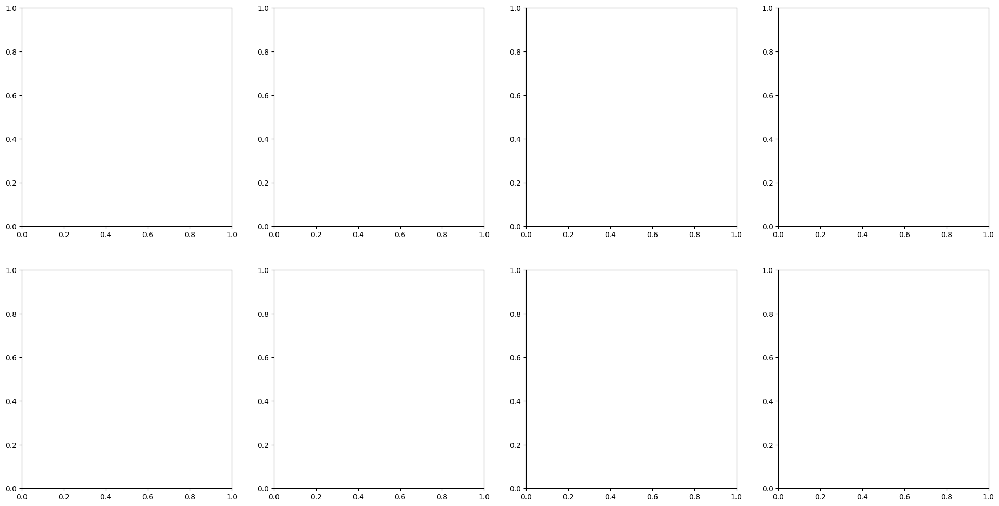

In [3]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from scipy.special import expit

warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION & STYLE
# ==========================================
RESULTS_DIR = "./output_offensive_speech/results_hs"
# Updated version to v6 to force rebuild with instruction data
CACHE_PATH = "./output_offensive_speech/calibration_cache_v0.parquet" 
PLOTS_OUTPUT_DIR = "./output/plots"

MODEL_FLAT_LIST = [
    'results_google_gemma-3-1b-it_bf16.csv',  'results_google_gemma-3-4b-it_bf16.csv',
    'results_google_gemma-3-12b-it_bf16.csv', 'results_google_gemma-3-27b-it_bf16.csv',
    'results_Qwen_Qwen3-4B_bf16.csv',         'results_Qwen_Qwen3-8B_bf16.csv',
    'results_Qwen_Qwen3-14B_bf16.csv',        'results_Qwen_Qwen3-32B_bf16.csv'
]

FONT_SIZE_SUPTITLE = 32
FONT_SIZE_TITLE = 20
FONT_SIZE_AXIS = 16
FONT_SIZE_TICK = 12
FONT_SIZE_LEGEND = 16

W_SPACE = -0.2
H_SPACE = 0.17
MARGIN_LEFT = 0.05
MARGIN_RIGHT = 0.90 
MARGIN_TOP = 0.88
MARGIN_BOTTOM = 0.15

# ==========================================
# 2. DATA ENGINE (Updated to include instructions)
# ==========================================
def get_calibration_data():
    if os.path.exists(CACHE_PATH):
        return pd.read_parquet(CACHE_PATH)

    print("--- Rebuilding Cache: Including Instruction Data ---")
    master_list = []
    for fname in MODEL_FLAT_LIST:
        fpath = os.path.join(RESULTS_DIR, fname)
        if not os.path.exists(fpath): continue
        
        df_raw = pd.read_csv(fpath)
        # Extract instruction index if available, else default to 0
        instr_vals = df_raw['instr_idx'].values if 'instr_idx' in df_raw.columns else np.zeros(len(df_raw))

        p0_cols = sorted([c for c in df_raw.columns if 'prob_ans_0' in c])
        p1_cols = sorted([c for c in df_raw.columns if 'prob_ans_1' in c])
        g_cols  = sorted([c for c in df_raw.columns if 'is_hate_speech' in c])

        for i in range(len(p0_cols)):
            h_raw = df_raw[p0_cols[i]].values
            c_raw = df_raw[p1_cols[i]].values
            
            p_hate = np.where(h_raw < c_raw, h_raw, 1.0 - c_raw)
            p_clean = 1.0 - p_hate
            gt = df_raw[g_cols[i]].astype(str).str.lower().isin(['true', '1', 'yes']).astype(int)
            
            temp = pd.DataFrame({
                'file': fname, 
                'p_hate': p_hate, 
                'p_clean': p_clean, 
                'gt': gt,
                'instr_idx': instr_vals # Store instruction context
            }).dropna()
            master_list.append(temp)

    master_df = pd.concat(master_list, ignore_index=True)
    master_df['logit'] = np.log(np.maximum(master_df['p_hate'], 1e-25)) - \
                         np.log(np.maximum(master_df['p_clean'], 1e-25))
    
    os.makedirs(os.path.dirname(CACHE_PATH), exist_ok=True)
    master_df.to_parquet(CACHE_PATH, index=False)
    return master_df

def compute_geometry(df_subset):
    l_vals = df_subset['logit'].values
    p_hate = expit(l_vals)
    gt = df_subset['gt'].values
    
    # Pareto frontier calculation
    idx = np.argsort(p_hate)
    p_sorted = p_hate[idx]
    gt_sorted = gt[idx]
    
    # X axis: TN/(TN + FP) | Y axis: TP/(TP + FN)
    tnr = np.cumsum(1 - gt_sorted) / (np.sum(1 - gt) + 1e-9)
    tpr = np.cumsum(gt_sorted[::-1])[::-1] / (np.sum(gt) + 1e-9)
    
    hard_mask = (p_hate >= 0.5)
    h_tpr = np.sum(hard_mask & (gt == 1)) / (np.sum(gt == 1) + 1e-9)
    h_tnr = np.sum((~hard_mask) & (gt == 0)) / (np.sum(gt == 0) + 1e-9)
    
    # Soft (Temperature) points
    temps = np.concatenate([[1e-5], np.geomspace(0.01, 20, 150)])
    soft_pts = []
    is_h, is_c = (gt == 1), (gt == 0)
    for T in temps:
        p_t = expit(l_vals / T)
        soft_pts.append([np.mean(1 - p_t[is_c]), np.mean(p_t[is_h])])
        
    return (tnr, tpr, p_sorted), np.array(soft_pts), temps, (h_tnr, h_tpr)

# ==========================================
# 3. PLOTTING
# ==========================================
master_data = get_calibration_data()
fig, axes = plt.subplots(2, 4, figsize=(24, 12), facecolor='white')
axes_flat = axes.flatten()

v_data = plt.cm.magma(np.linspace(0, 1, 256))
v_data[:, -1] = np.linspace(1, 0.1, 256) 
fade_magma = LinearSegmentedColormap.from_list('FadeMagma', v_data)

for i, fname in enumerate(MODEL_FLAT_LIST):
    ax = axes_flat[i]
    df_model = master_data[master_data['file'] == fname]
    if df_model.empty: continue

    # --- NEW PART: Instruction-specific Pareto lines ---
    # We plot these first so they stay in the background
    unique_instrs = df_model['instr_idx'].unique()
    for instr in unique_instrs:
        df_instr = df_model[df_model['instr_idx'] == instr]
        if len(df_instr['gt'].unique()) < 2: continue # Need both classes
        
        # We only need the tnr/tpr part of the geometry for these background lines
        (i_tnr, i_tpr, _), _, _, _ = compute_geometry(df_instr)
        
        # Plot as a thin grey line
        ax.plot(i_tnr, i_tpr, color='gray', linewidth=0.8, alpha=0.3, zorder=2)

    # --- Original Global Geometry ---
    (tnr, tpr, p_sorted), soft_pts, temps, hard_pt = compute_geometry(df_model)
    
    step = max(1, len(tnr) // 5000)
    tnr_p, tpr_p, p_p = tnr[::step], tpr[::step], p_sorted[::step]
    
    h_seg = np.stack([np.column_stack([tnr_p[:-1], tpr_p[:-1]]), 
                      np.column_stack([tnr_p[1:], tpr_p[1:]])], axis=1)
    lc_h = LineCollection(h_seg, cmap='viridis', alpha=0.6, linewidths=3, zorder=4)
    lc_h.set_array(p_p) 
    ax.add_collection(lc_h)
    
    s_seg = np.stack([soft_pts[:-1], soft_pts[1:]], axis=1)
    lc_s = LineCollection(s_seg, cmap=fade_magma, linewidths=6, zorder=5)
    lc_s.set_array(np.clip(temps, 0, 5.0))
    ax.add_collection(lc_s)
    
    m_hard = ax.scatter(hard_pt[0], hard_pt[1], color='white', edgecolor='black', 
                        marker='D', s=120, zorder=10, label='Hard Threshold ($t=0.5$)')

    # Formatting
    clean_name = fname.replace('results_', '').replace('_bf16.csv', '').split('_')[-1]
    ax.set_title(clean_name, fontsize=FONT_SIZE_TITLE, fontweight='bold', pad=8)
    ax.set_xlim(-0.02, 1.02); ax.set_ylim(-0.02, 1.02)
    ax.set_aspect('equal')
    ax.grid(True, linestyle=':', alpha=0.4)
    ax.plot([0, 1], [1, 0], color='black', linestyle='--', alpha=0.3, zorder=1) 
    
    if i // 4 == 1: ax.set_xlabel("Specificity (TN/TN+FP)", fontsize=FONT_SIZE_AXIS)
    if i % 4 == 0: ax.set_ylabel("Recall (TP/TP+FN)", fontsize=FONT_SIZE_AXIS)

# Layout adjustments
plt.subplots_adjust(left=MARGIN_LEFT, right=MARGIN_RIGHT, top=MARGIN_TOP, bottom=MARGIN_BOTTOM, wspace=W_SPACE, hspace=H_SPACE)

# Colorbars
cax1 = fig.add_axes([0.87, 0.56, 0.015, 0.3])
fig.colorbar(lc_h, cax=cax1).set_label('Decision Threshold $t$', fontsize=FONT_SIZE_LEGEND)
cax2 = fig.add_axes([0.87, 0.17, 0.015, 0.3])
fig.colorbar(lc_s, cax=cax2).set_label('Temperature ($T$)', fontsize=FONT_SIZE_LEGEND)

# Add a proxy line for the instruction legend
instr_line = plt.Line2D([0], [0], color='gray', lw=1, alpha=0.6, label='Individual Instructions')

fig.legend(handles=[m_hard, instr_line], loc='lower center', bbox_to_anchor=(0.5, 0.04), 
           fontsize=FONT_SIZE_LEGEND, ncol=2)

plt.suptitle("Pareto Frontiers and Instruction Sensitivity", 
             fontsize=FONT_SIZE_SUPTITLE, fontweight='bold', y=0.96)

os.makedirs(PLOTS_OUTPUT_DIR, exist_ok=True)
plt.savefig(os.path.join(PLOTS_OUTPUT_DIR, "Pareto_Instruction_Shifts.png"), dpi=200, bbox_inches='tight')
plt.show()